# Mount Google Deive

In [ ]:
from google.colab import drive
# Mount the Google Drive at /content/drive
drive.mount('/content/drive')

Mounted at /content/drive


# Hyper-parameter tuning
- https://docs.ultralytics.com/integrations/ray-tune/#how-can-i-integrate-weights-biases-with-my-yolo11-model-tuning

In [ ]:
# Install and update Ultralytics and Ray Tune packages
%pip install -U ultralytics "ray[tune]"

# Optionally install W&B for logging
%pip install wandb

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.7/877.7 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.9/241.9 kB 15.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 MB 18.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.5/314.5 kB 14.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 3.5 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import ray
from ray import tune
from ray.tune.schedulers import ASHAScheduler
from ray.tune import CLIReporter
import wandb

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
# Initialize the YOLO model
model = YOLO("yolo11n.pt")

# login to WandB
wandb.login(key = "8ce52eebbb47888d7b9a5b83ddfe0c17a56b1f24")

# Define search space
search_space = {
    "box": tune.grid_search([8.0, 9.0, 10.0]),
    "cls": tune.grid_search([0.85, 0.95]),
    "lr0": tune.grid_search([0.0008]),
    "imgsz": tune.grid_search([1280]),
}


# Define Ray Tune scheduler and reporter
scheduler = ASHAScheduler(
    metric="metrics/mAP50-95(B)",
    mode="max",
    max_t=100,  # epochs
    grace_period=10,
    reduction_factor=2
)

reporter = CLIReporter(
    parameter_columns=["box", "cls", "lr0", "imgsz"],
    metric_columns=["metrics/mAP50-95(B)", "bbox_loss"]
)

# Ray Tune objective function to tune hyperparameters
def tune_objective(config):
    # Train the model
    results = model.train(
        data="/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml",
        epochs=100,
        batch = 16,
        imgsz=config['imgsz'],
        optimizer="AdamW",
        lr0=config["lr0"],
        box=config["box"],
        cls=config["cls"],
        patience=5,
        save=True,
        plots=False,
        val=True,  # Disable validation to speed up the process
        project = "tb_yolo_grid"
    )


# Run Ray Tune
analysis = tune.run(
    tune_objective,
    config=search_space,
    num_samples=1,  # Only one sample per trial because grid search will try all combinations
    scheduler=scheduler,
    progress_reporter=reporter,
    resources_per_trial=None,
    storage_path="/content/drive/MyDrive/ray_results",  # Directory to store tuning results
    name="tb_yolo_grid",
    time_budget_s=36000, # set time limit to 10 hours
    max_concurrent_trials= 25,
)

100%|██████████| 5.35M/5.35M [00:00<00:00, 70.4MB/s]
wandb: Using wandb-core as the SDK backend. Please refer to https://wandb.me/wandb-core for more information.
wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
2024-10-29 09:44:23,623	INFO worker.py:1816 -- Started a local Ray instance.
2024-10-29 09:44:24,908	INFO tune.py:253 -- Initializing Ray automatically. For cluster usage or custom Ray initialization, call `ray.init(...)` before `tune.run(...)`.
2024-10-29 09:44:25,760	WARNING tune.py:902 -- AIR_VERBOSITY is set, ignoring passed-in ProgressReporter for now.


+----------------------------------------------------------+
| Configuration for experiment     tb_yolo_grid            |
+----------------------------------------------------------+
| Search algorithm                 BasicVariantGenerator   |
| Scheduler                        AsyncHyperBandScheduler |
| Number of trials                 6                       |
+----------------------------------------------------------+

View detailed results here: /content/drive/MyDrive/ray_results/tb_yolo_grid
To visualize your results with TensorBoard, run: `tensorboard --logdir /tmp/ray/session_2024-10-29_09-44-21_774476_3464/artifacts/2024-10-29_09-44-25/tb_yolo_grid/driver_artifacts`
(raylet) Warning: The actor ImplicitFunc is very large (20 MiB). Check that its definition is not implicitly capturing a large array or other object in scope. Tip: use ray.put() to put large objects in the Ray object store.

Trial status: 6 PENDING
Current time: 2024-10-29 09:44:28. Total running time: 2s
Logical 

  0%|          | 0.00/755k [00:00<?, ?B/s]
100%|██████████| 755k/755k [00:00<00:00, 14.2MB/s]
100%|██████████| 755k/755k [00:00<00:00, 13.6MB/s]
100%|██████████| 755k/755k [00:00<00:00, 14.2MB/s]
100%|██████████| 755k/755k [00:00<00:00, 14.3MB/s]
100%|██████████| 755k/755k [00:00<00:00, 14.0MB/s]
100%|██████████| 755k/755k [00:00<00:00, 13.1MB/s]


(tune_objective pid=10014) Overriding model.yaml nc=80 with nc=45
(tune_objective pid=10014) 
(tune_objective pid=10014)                    from  n    params  module                                       arguments                     
(tune_objective pid=10014)   0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
(tune_objective pid=10014)   1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
(tune_objective pid=10014)   2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
(tune_objective pid=10014)   3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
(tune_objective pid=10014)   4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
(tune_objective pid=10014)   5                  -1  1    147

train: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/train_augmented.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]
  0%|          | 0.00/755k [00:00<?, ?B/s] [repeated 5x across cluster] (Ray deduplicates logs by default. Set RAY_DEDUP_LOGS=0 to disable log deduplication, or see https://docs.ray.io/en/master/ray-observability/user-guides/configure-logging.html#log-deduplication for more options.)


(tune_objective pid=10012) optimizer: AdamW(lr=0.0008, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
(tune_objective pid=10017) Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cpu CPU (Intel Xeon 2.00GHz) [repeated 5x across cluster]
(tune_objective pid=10017) engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml, epochs=100, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=tb_yolo_grid, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plo

  0%|          | 0/8 [00:00<?, ?it/s]
train: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/train_augmented.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s] [repeated 5x across cluster]
val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s] [repeated 5x across cluster]


(tune_objective pid=10012) 
(tune_objective pid=10013) 
(tune_objective pid=10016) 
(tune_objective pid=10017) 


      1/100         0G      3.409      9.513      1.742        284        640:  12%|█▎        | 1/8 [00:09<01:05,  9.39s/it]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 5x across cluster]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:44:58. Total running time: 32s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz |
+--------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640 |
| tune_objective_62290_00001   RUNNING        9    0.85   0.0008       640 |
| tune_objective_62290_00002   RUNNING       10    0.85   0.0008       640 |
| tune_objective_62290_00003   RUNNING        8    0.95   0.0008       640 |
| tune_objective_62290_00004   RUNNING        9    0.95   0.0008       640 |
| tune_objective_62290_00005   RUNNING       10    0.95   0.0008       640 |
+--------------------------------------------------------------------------+


      1/100         0G      2.942      9.253      1.568        294        640:  25%|██▌       | 2/8 [00:16<00:47,  7.86s/it]
      1/100         0G      4.261      9.513      1.742        284        640:  12%|█▎        | 1/8 [00:10<01:12, 10.40s/it] [repeated 5x across cluster]
      1/100         0G      2.428      9.014      1.423        265        640:  38%|███▊      | 3/8 [00:23<00:37,  7.43s/it] [repeated 6x across cluster]
      1/100         0G      2.188        8.9      1.347        286        640:  50%|█████     | 4/8 [00:29<00:27,  6.91s/it] [repeated 6x across cluster]
      1/100         0G      2.064      8.781      1.293        327        640:  62%|██████▎   | 5/8 [00:35<00:20,  6.71s/it] [repeated 6x across cluster]
      1/100         0G      2.582       9.81      1.291        327        640:  50%|█████     | 4/8 [00:37<00:29,  7.27s/it]
      1/100         0G      2.582       9.81      1.291        327        640:  62%|██████▎   | 5/8 [00:38<00:22,  7.55s/it]


Trial status: 6 RUNNING
Current time: 2024-10-29 09:45:28. Total running time: 1min 2s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz |
+--------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640 |
| tune_objective_62290_00001   RUNNING        9    0.85   0.0008       640 |
| tune_objective_62290_00002   RUNNING       10    0.85   0.0008       640 |
| tune_objective_62290_00003   RUNNING        8    0.95   0.0008       640 |
| tune_objective_62290_00004   RUNNING        9    0.95   0.0008       640 |
| tune_objective_62290_00005   RUNNING       10    0.95   0.0008       640 |
+--------------------------------------------------------------------------+


      1/100         0G      1.993      8.691      1.266        262        640:  75%|███████▌  | 6/8 [00:43<00:14,  7.09s/it] [repeated 5x across cluster]
      1/100         0G      1.897      8.591      1.223        254        640:  88%|████████▊ | 7/8 [00:49<00:06,  6.75s/it] [repeated 6x across cluster]
      1/100         0G      1.868      8.498      1.206        193        640: 100%|██████████| 8/8 [00:53<00:00,  6.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      1/100         0G      2.377      9.606      1.224        254        640:  88%|████████▊ | 7/8 [00:52<00:07,  7.08s/it] [repeated 5x across cluster]


Trial status: 6 RUNNING
Current time: 2024-10-29 09:45:58. Total running time: 1min 32s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz |
+--------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640 |
| tune_objective_62290_00001   RUNNING        9    0.85   0.0008       640 |
| tune_objective_62290_00002   RUNNING       10    0.85   0.0008       640 |
| tune_objective_62290_00003   RUNNING        8    0.95   0.0008       640 |
| tune_objective_62290_00004   RUNNING        9    0.95   0.0008       640 |
| tune_objective_62290_00005   RUNNING       10    0.95   0.0008       640 |
+--------------------------------------------------------------------------+
(tune_objective pid=10012)                    all

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:19<00:00, 19.05s/it]
      1/100         0G      2.343      9.503      1.207        193        640: 100%|██████████| 8/8 [00:55<00:00,  6.96s/it] [repeated 5x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 5x across cluster]



Trial tune_objective_62290_00004 finished iteration 1 at 2024-10-29 09:46:00. Total running time: 1min 35s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            88.0178 |
| time_total_s                                88.0178 |
| training_iteration                                1 |
| epoch                                             0 |
| metrics/mAP50(B)                                  0 |
| metrics/mAP50-95(B)                               0 |
| metrics/precision(B)                              0 |
| metrics/recall(B)                                 0 |
| val/box_loss                                 2.9347 |
| val/cls_loss                                9.88099 |
| val/dfl_loss                                 1.5019 |
+---------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10015) 
(tune_objective pid=10016) 
(tune_objective pid=10012) 
(tune_objective pid=10014) 
(tune_objective pid=10017) 


      2/100         0G      1.614      7.857        1.1        374        640:  12%|█▎        | 1/8 [00:03<00:27,  3.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:17<00:00, 17.82s/it] [repeated 5x across cluster]
      2/100         0G      1.434      7.701      1.053        272        640:  25%|██▌       | 2/8 [00:07<00:23,  3.94s/it]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 5x across cluster]
      2/100         0G      1.626      8.803      1.092        374        640:  12%|█▎        | 1/8 [00:04<00:32,  4.63s/it] [repeated 5x across cluster]
      2/100         0G      1.545      8.546       1.03        257        640:  38%|███▊      | 3/8 [00:13<00:22,  4.43s/it] [repeated 10x across cluster]
      2/100         0G       1.34      7.496      1.007        215        640:  62%|██████▎   | 5/8 [00:19<00:11,  3.93s/it] [repeated 8x across cluster]
      2/100         0G      1.696      8.349       1.01


Trial status: 6 RUNNING
Current time: 2024-10-29 09:46:28. Total running time: 2min 2s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        1            87.9858                        0                     0                    0                       0 |
| tune_objective_62290_00001   

      2/100         0G      1.329      8.244      1.003        364        640:  88%|████████▊ | 7/8 [00:30<00:04,  4.20s/it] [repeated 8x across cluster]
      2/100         0G      1.301      7.285     0.9986        141        640: 100%|██████████| 8/8 [00:30<00:00,  3.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.98s/it]
      2/100         0G      1.302      8.152     0.9943        141        640: 100%|██████████| 8/8 [00:32<00:00,  4.03s/it] [repeated 5x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 5x across cluster]


(tune_objective pid=10013)                    all         31        498          0          0          0          0 [repeated 6x across cluster]
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 6x across cluster]

Trial tune_objective_62290_00000 finished iteration 2 at 2024-10-29 09:46:41. Total running time: 2min 15s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            40.3237 |
| time_total_s                                128.309 |
| training_iteration                                2 |
| epoch                                             1 |
| metrics/mAP50(B)                                  0 |
| metrics/mAP50-95(B)                               0 |
| metrics/precision(B)                              0

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10012) 
(tune_objective pid=10015) 

Trial tune_objective_62290_00005 finished iteration 2 at 2024-10-29 09:46:42. Total running time: 2min 16s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            41.8668 |
| time_total_s                                129.851 |
| training_iteration                                2 |
| epoch                                             1 |
| metrics/mAP50(B)                                  0 |
| metrics/mAP50-95(B)                               0 |
| metrics/precision(B)                              0 |
| metrics/recall(B)                                 0 |
| val/box_loss                                 2.7457 |
| val/cls_loss                                9.49621 |
| val/dfl_loss                                1.3925

      3/100         0G      1.324      6.697     0.9729        350        640:  12%|█▎        | 1/8 [00:03<00:26,  3.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.14s/it] [repeated 5x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 5x across cluster]
      3/100         0G      1.241      6.618     0.9748        293        640:  25%|██▌       | 2/8 [00:08<00:25,  4.20s/it]
      3/100         0G      1.335      7.516     0.9768        350        640:  12%|█▎        | 1/8 [00:04<00:28,  4.13s/it] [repeated 5x across cluster]
      3/100         0G      1.339      7.426     0.9814        309        640:  38%|███▊      | 3/8 [00:11<00:19,  3.95s/it] [repeated 8x across cluster]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:46:58. Total running time: 2min 32s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        2            128.309                  0                     0                    0                       0       |
| tune_objective_62290_00001  

      3/100         0G      1.163      7.298     0.9835        201        640:  50%|█████     | 4/8 [00:16<00:16,  4.07s/it] [repeated 8x across cluster]
      3/100         0G      1.247      6.609      0.968        275        640:  75%|███████▌  | 6/8 [00:24<00:08,  4.12s/it] [repeated 8x across cluster]
      3/100         0G      1.235      6.549     0.9674        136        640: 100%|██████████| 8/8 [00:30<00:00,  3.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      3/100         0G       1.27      7.346     0.9652        343        640:  88%|████████▊ | 7/8 [00:28<00:04,  4.10s/it] [repeated 8x across cluster]


(tune_objective pid=10012)                    all         31        498   2.08e-05     0.0198     0.0038    0.00183 [repeated 6x across cluster]
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 6x across cluster]


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.12s/it]
      3/100         0G      1.424      7.288     0.9793        136        640: 100%|██████████| 8/8 [00:32<00:00,  4.07s/it] [repeated 5x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 5x across cluster]
      3/100         0G      1.433      7.357     0.9804        343        640:  88%|████████▊ | 7/8 [00:30<00:04,  4.47s/it] [repeated 3x across cluster]



Trial tune_objective_62290_00001 finished iteration 3 at 2024-10-29 09:47:22. Total running time: 2min 56s
+-----------------------------------------------------+
| Trial tune_objective_62290_00001 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             40.793 |
| time_total_s                                169.632 |
| training_iteration                                3 |
| epoch                                             2 |
| metrics/mAP50(B)                             0.0038 |
| metrics/mAP50-95(B)                         0.00183 |
| metrics/precision(B)                          2e-05 |
| metrics/recall(B)                           0.01975 |
| val/box_loss                                 1.7511 |
| val/cls_loss                                7.98595 |
| val/dfl_loss                                1.08154 |
+---------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s]



Trial tune_objective_62290_00000 finished iteration 3 at 2024-10-29 09:47:23. Total running time: 2min 57s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            42.3026 |
| time_total_s                                170.612 |
| training_iteration                                3 |
| epoch                                             2 |
| metrics/mAP50(B)                            0.00169 |
| metrics/mAP50-95(B)                         0.00054 |
| metrics/precision(B)                         0.0004 |
| metrics/recall(B)                           0.00741 |
| val/box_loss                                1.66371 |
| val/cls_loss                                8.17798 |
| val/dfl_loss                                1.18923 |
+---------------------------------------------------

      4/100         0G      1.222      6.288     0.9769        362        640:  12%|█▎        | 1/8 [00:03<00:24,  3.50s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.39s/it] [repeated 5x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 5x across cluster]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:47:28. Total running time: 3min 2s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        3            170.612                  0.0004                0.00741              0.00169                 0.00054 |
| tune_objective_62290_00001   

      4/100         0G      1.436      6.329      1.002        245        640:  25%|██▌       | 2/8 [00:07<00:23,  3.90s/it]
      4/100         0G      1.394      7.051     0.9842        362        640:  12%|█▎        | 1/8 [00:04<00:30,  4.37s/it] [repeated 5x across cluster]
      4/100         0G      1.267      7.047     0.9834        290        640:  38%|███▊      | 3/8 [00:11<00:19,  3.90s/it] [repeated 8x across cluster]
      4/100         0G      1.542      6.336      0.984        316        640:  50%|█████     | 4/8 [00:17<00:17,  4.32s/it] [repeated 8x across cluster]
      4/100         0G      1.253      6.989     0.9711        285        640:  75%|███████▌  | 6/8 [00:24<00:08,  4.11s/it] [repeated 10x across cluster]
      4/100         0G       1.36      6.282     0.9539        160        640: 100%|██████████| 8/8 [00:30<00:00,  3.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     

Trial status: 6 RUNNING
Current time: 2024-10-29 09:47:58. Total running time: 3min 32s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        3            170.612                  0.0004                0.00741              0.00169                 0.00054 |
| tune_objective_62290_00001   

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.07s/it]
      4/100         0G      1.554      7.013     0.9667        160        640: 100%|██████████| 8/8 [00:31<00:00,  3.96s/it] [repeated 5x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 5x across cluster]
      4/100         0G      1.571      7.041     0.9698        320        640:  88%|████████▊ | 7/8 [00:30<00:04,  4.22s/it] [repeated 2x across cluster]



Trial tune_objective_62290_00001 finished iteration 4 at 2024-10-29 09:48:02. Total running time: 3min 37s
+-----------------------------------------------------+
| Trial tune_objective_62290_00001 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             40.401 |
| time_total_s                                210.033 |
| training_iteration                                4 |
| epoch                                             3 |
| metrics/mAP50(B)                            0.01991 |
| metrics/mAP50-95(B)                         0.01519 |
| metrics/precision(B)                        0.00739 |
| metrics/recall(B)                            0.0321 |
| val/box_loss                                1.34915 |
| val/cls_loss                                7.76086 |
| val/dfl_loss                                0.99096 |
+---------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 

Trial tune_objective_62290_00003 finished iteration 4 at 2024-10-29 09:48:04. Total running time: 3min 38s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            40.3541 |
| time_total_s                                211.256 |
| training_iteration                                4 |
| epoch                                             3 |
| metrics/mAP50(B)                            0.02332 |
| metrics/mAP50-95(B)                         0.01621 |
| metrics/precision(B)                        0.00025 |
| metrics/recall(B)                           0.04444 |
| val/box_loss                                1.23249 |
| val/cls_loss                                8.69186 |
| val/dfl_loss                                0.99706 |
+-----------------------

      5/100         0G      1.311      6.236     0.9702        389        640:  12%|█▎        | 1/8 [00:03<00:27,  4.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.70s/it] [repeated 5x across cluster]
(tune_objective pid=10014) 


(tune_objective pid=10014)                    all         31        498   0.000113     0.0444     0.0278     0.0176 [repeated 5x across cluster]
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 4x across cluster]
(tune_objective pid=10015) 

Trial tune_objective_62290_00005 finished iteration 4 at 2024-10-29 09:48:08. Total running time: 3min 42s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            42.4504 |
| time_total_s                                215.078 |
| training_iteration                                4 |
| epoch                                             3 |
| metrics/mAP50(B)                            0.02782 |
| metrics/mAP50-95(B)                         0.01762 |
| metrics/precision(B)   

  0%|          | 0/8 [00:00<?, ?it/s] [repeated 5x across cluster]


(tune_objective pid=10014) 


      5/100         0G      1.316      6.093     0.9833        246        640:  25%|██▌       | 2/8 [00:07<00:23,  3.96s/it]
      5/100         0G      1.141      6.167     0.9677        389        640:  12%|█▎        | 1/8 [00:03<00:27,  3.91s/it] [repeated 3x across cluster]
      5/100         0G      1.443      6.081     0.9775        246        640:  25%|██▌       | 2/8 [00:08<00:26,  4.34s/it] [repeated 6x across cluster]
      5/100         0G      1.493       6.91     0.9765        389        640:  12%|█▎        | 1/8 [00:04<00:32,  4.66s/it] [repeated 2x across cluster]
      5/100         0G      1.498      6.691     0.9865        369        640:  38%|███▊      | 3/8 [00:13<00:21,  4.40s/it] [repeated 8x across cluster]
      5/100         0G       1.24      5.891     0.9674        303        640:  75%|███████▌  | 6/8 [00:24<00:08,  4.24s/it] [repeated 8x across cluster]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:48:28. Total running time: 4min 2s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        4            211.876                  0.00014               0.0321               0.00359                 0.00178 |
| tune_objective_62290_00001   

      5/100         0G      1.123      6.525     0.9651        364        640:  88%|████████▊ | 7/8 [00:28<00:04,  4.17s/it] [repeated 8x across cluster]
      5/100         0G      1.247      5.871     0.9637        212        640: 100%|██████████| 8/8 [00:31<00:00,  3.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      5/100         0G       1.37      5.895     0.9614        364        640:  88%|████████▊ | 7/8 [00:31<00:04,  4.26s/it] [repeated 5x across cluster]
      5/100         0G      1.378      5.881     0.9634        212        640: 100%|██████████| 8/8 [00:32<00:00,  4.11s/it] [repeated 5x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 5x across cluster]


(tune_objective pid=10012)                    all         31        498     0.0414      0.156     0.0624     0.0511
(tune_objective pid=10014)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 2x across cluster]
(tune_objective pid=10016)                    all         31        498     0.0264      0.079     0.0564     0.0474


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.45s/it]



Trial tune_objective_62290_00004 finished iteration 5 at 2024-10-29 09:48:44. Total running time: 4min 19s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            41.5744 |
| time_total_s                                252.116 |
| training_iteration                                5 |
| epoch                                             4 |
| metrics/mAP50(B)                            0.05643 |
| metrics/mAP50-95(B)                         0.04738 |
| metrics/precision(B)                         0.0264 |
| metrics/recall(B)                           0.07901 |
| val/box_loss                                1.26739 |
| val/cls_loss                                8.62709 |
| val/dfl_loss                                0.95887 |
+---------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 

Trial tune_objective_62290_00000 finished iteration 5 at 2024-10-29 09:48:46. Total running time: 4min 20s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            41.4253 |
| time_total_s                                253.302 |
| training_iteration                                5 |
| epoch                                             4 |
| metrics/mAP50(B)                            0.05296 |
| metrics/mAP50-95(B)                           0.039 |
| metrics/precision(B)                        0.02904 |
| metrics/recall(B)                           0.11191 |
| val/box_loss                                1.04671 |
| val/cls_loss                                 7.6708 |
| val/dfl_loss                                  0.954 |
+-----------------------

      6/100         0G       1.38      6.449     0.9565        325        640:  12%|█▎        | 1/8 [00:03<00:24,  3.55s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.36s/it] [repeated 3x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 3x across cluster]


(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 4x across cluster]
(tune_objective pid=10014)                    all         31        498    0.00446     0.0681     0.0342     0.0249 [repeated 3x across cluster]

Trial tune_objective_62290_00005 finished iteration 5 at 2024-10-29 09:48:51. Total running time: 4min 25s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            43.2148 |
| time_total_s                                258.293 |
| training_iteration                                5 |
| epoch                                             4 |
| metrics/mAP50(B)                             0.0342 |
| metrics/mAP50-95(B)                          0.0249 |
| metrics/precision(B)                        0.00446

      6/100         0G      1.403      6.364     0.9506        313        640:  25%|██▌       | 2/8 [00:07<00:21,  3.66s/it]


(tune_objective pid=10015) 


      6/100         0G      1.194      5.743     0.9553        325        640:  12%|█▎        | 1/8 [00:03<00:26,  3.82s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:11<00:00, 11.20s/it] [repeated 2x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 2x across cluster]
      6/100         0G      1.303      5.628     0.9643        280        640:  38%|███▊      | 3/8 [00:12<00:21,  4.24s/it] [repeated 6x across cluster]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:48:58. Total running time: 4min 32s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        5            253.302                  0.02904               0.11191              0.05296                 0.039   |
| tune_objective_62290_00001  

      6/100         0G      1.487      5.753     0.9542        325        640:  12%|█▎        | 1/8 [00:04<00:33,  4.77s/it] [repeated 2x across cluster]
      6/100         0G      1.158       5.57     0.9603        390        640:  50%|█████     | 4/8 [00:16<00:17,  4.28s/it] [repeated 7x across cluster]
      6/100         0G      1.326      6.259     0.9609        288        640:  75%|███████▌  | 6/8 [00:23<00:07,  3.92s/it] [repeated 7x across cluster]
      6/100         0G      1.159      6.131     0.9679        327        640:  88%|████████▊ | 7/8 [00:28<00:04,  4.14s/it] [repeated 7x across cluster]
      6/100         0G      1.298      6.156     0.9575        162        640: 100%|██████████| 8/8 [00:29<00:00,  3.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      6/100         0G      1.432      5.608     0.9651        288        640:  75%|███████▌  | 6/8 [00:26<00:08,  4.24s/it] [repea

(tune_objective pid=10015)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 2x across cluster]
(tune_objective pid=10016)                    all         31        498     0.0581        0.2      0.135      0.107 [repeated 2x across cluster]

Trial tune_objective_62290_00004 finished iteration 6 at 2024-10-29 09:49:24. Total running time: 4min 58s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.5497 |
| time_total_s                                291.665 |
| training_iteration                                6 |
| epoch                                             5 |
| metrics/mAP50(B)                             0.1351 |
| metrics/mAP50-95(B)                         0.10709 |
| metrics/precision(B)                         0.0581

  0%|          | 0/8 [00:00<?, ?it/s]
      6/100         0G      1.419       5.56      0.962        327        640:  88%|████████▊ | 7/8 [00:30<00:04,  4.14s/it] [repeated 2x across cluster]


(tune_objective pid=10016) 

Trial tune_objective_62290_00003 finished iteration 6 at 2024-10-29 09:49:25. Total running time: 4min 59s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            40.3331 |
| time_total_s                                292.752 |
| training_iteration                                6 |
| epoch                                             5 |
| metrics/mAP50(B)                             0.1443 |
| metrics/mAP50-95(B)                         0.11349 |
| metrics/precision(B)                        0.04879 |
| metrics/recall(B)                           0.27377 |
| val/box_loss                                1.03211 |
| val/cls_loss                                 8.4888 |
| val/dfl_loss                                0.92376 |
+-----------------------

      6/100         0G      1.408      5.515     0.9615        162        640: 100%|██████████| 8/8 [00:32<00:00,  4.05s/it] [repeated 2x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 2x across cluster]
      7/100         0G      1.207      6.031     0.9727        336        640:  12%|█▎        | 1/8 [00:03<00:23,  3.33s/it]



Trial tune_objective_62290_00000 finished iteration 6 at 2024-10-29 09:49:28. Total running time: 5min 2s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            42.2325 |
| time_total_s                                295.534 |
| training_iteration                                6 |
| epoch                                             5 |
| metrics/mAP50(B)                            0.12713 |
| metrics/mAP50-95(B)                         0.09847 |
| metrics/precision(B)                        0.05013 |
| metrics/recall(B)                           0.23543 |
| val/box_loss                                0.96584 |
| val/cls_loss                                 7.5821 |
| val/dfl_loss                                0.91902 |
+----------------------------------------------------

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.62s/it] [repeated 3x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s] [repeated 3x across cluster]
      7/100         0G      1.332      5.867     0.9704        309        640:  25%|██▌       | 2/8 [00:07<00:21,  3.55s/it]
      7/100         0G      1.052      5.284     0.9603        336        640:  12%|█▎        | 1/8 [00:03<00:25,  3.68s/it] [repeated 3x across cluster]


(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 4x across cluster]
(tune_objective pid=10014)                    all         31        498     0.0503      0.274      0.148      0.115 [repeated 4x across cluster]

Trial tune_objective_62290_00005 finished iteration 6 at 2024-10-29 09:49:34. Total running time: 5min 8s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            43.1519 |
| time_total_s                                301.444 |
| training_iteration                                6 |
| epoch                                             5 |
| metrics/mAP50(B)                            0.14836 |
| metrics/mAP50-95(B)                           0.115 |
| metrics/precision(B)                        0.05033 

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.48s/it]


(tune_objective pid=10014) 


  0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.93s/it]



Trial tune_objective_62290_00002 finished iteration 6 at 2024-10-29 09:49:36. Total running time: 5min 11s
+-----------------------------------------------------+
| Trial tune_objective_62290_00002 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             44.191 |
| time_total_s                                 303.56 |
| training_iteration                                6 |
| epoch                                             5 |
| metrics/mAP50(B)                             0.1011 |
| metrics/mAP50-95(B)                         0.07603 |
| metrics/precision(B)                        0.01848 |
| metrics/recall(B)                           0.23285 |
| val/box_loss                                1.23695 |
| val/cls_loss                                7.66051 |
| val/dfl_loss                                0.94543 |
+---------------------------------------------------

      7/100         0G      1.143      5.703     0.9508        255        640:  38%|███▊      | 3/8 [00:10<00:18,  3.72s/it] [repeated 5x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10015) 


      7/100         0G      1.332      5.992     0.9657        336        640:  12%|█▎        | 1/8 [00:04<00:31,  4.47s/it]
      7/100         0G      1.293      5.176     0.9848        248        640:  50%|█████     | 4/8 [00:15<00:15,  3.94s/it] [repeated 5x across cluster]
      7/100         0G      1.343      5.434     0.9686        336        640:  12%|█▎        | 1/8 [00:04<00:32,  4.57s/it]
      7/100         0G      1.443      5.842     0.9651        255        640:  38%|███▊      | 3/8 [00:12<00:21,  4.27s/it] [repeated 7x across cluster]
      7/100         0G      1.121      5.654     0.9681        300        640:  88%|████████▊ | 7/8 [00:26<00:04,  4.01s/it] [repeated 9x across cluster]
      7/100         0G      1.264      5.736     0.9598        143        640: 100%|██████████| 8/8 [00:29<00:00,  3.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      7/100         0G      1.127  


Trial status: 6 RUNNING
Current time: 2024-10-29 09:49:58. Total running time: 5min 33s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        6            295.534                  0.05013               0.23543              0.12713                 0.09847 |
| tune_objective_62290_00001  

      7/100         0G      1.111      5.111     0.9609        143        640: 100%|██████████| 8/8 [00:29<00:00,  3.70s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.39s/it]
      7/100         0G      1.416      5.214     0.9655        343        640:  75%|███████▌  | 6/8 [00:24<00:07,  3.86s/it] [repeated 4x across cluster]


(tune_objective pid=10015)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 2x across cluster]
(tune_objective pid=10016)                    all         31        498     0.0437      0.307      0.161      0.129 [repeated 2x across cluster]

Trial tune_objective_62290_00004 finished iteration 7 at 2024-10-29 09:50:04. Total running time: 5min 38s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.6166 |
| time_total_s                                331.282 |
| training_iteration                                7 |
| epoch                                             6 |
| metrics/mAP50(B)                            0.16105 |
| metrics/mAP50-95(B)                         0.12866 |
| metrics/precision(B)                        0.04372

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 

Trial tune_objective_62290_00003 finished iteration 7 at 2024-10-29 09:50:05. Total running time: 5min 39s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.4058 |
| time_total_s                                332.158 |
| training_iteration                                7 |
| epoch                                             6 |
| metrics/mAP50(B)                            0.20062 |
| metrics/mAP50-95(B)                          0.1588 |
| metrics/precision(B)                        0.04106 |
| metrics/recall(B)                           0.33163 |
| val/box_loss                                0.95644 |
| val/cls_loss                                8.36498 |
| val/dfl_loss                                0.91208 |
+-----------------------

      7/100         0G      1.402      5.766     0.9631        143        640: 100%|██████████| 8/8 [00:28<00:00,  3.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      7/100         0G       1.39      5.185      0.955        143        640: 100%|██████████| 8/8 [00:30<00:00,  3.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      8/100         0G      1.314      5.598      1.001        317        640:  12%|█▎        | 1/8 [00:03<00:24,  3.52s/it]



Trial tune_objective_62290_00000 finished iteration 7 at 2024-10-29 09:50:08. Total running time: 5min 42s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            40.0992 |
| time_total_s                                335.633 |
| training_iteration                                7 |
| epoch                                             6 |
| metrics/mAP50(B)                            0.13584 |
| metrics/mAP50-95(B)                         0.11115 |
| metrics/precision(B)                        0.03167 |
| metrics/recall(B)                           0.33047 |
| val/box_loss                                0.97668 |
| val/cls_loss                                 7.4507 |
| val/dfl_loss                                0.91332 |
+---------------------------------------------------

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.69s/it] [repeated 3x across cluster]
      7/100         0G      1.416      5.196     0.9672        300        640:  88%|████████▊ | 7/8 [00:28<00:03,  3.75s/it]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 4x across cluster]
(tune_objective pid=10013)                    all         31        498     0.0317       0.33      0.136      0.111 [repeated 3x across cluster]


  0%|          | 0/8 [00:00<?, ?it/s] [repeated 3x across cluster]
      8/100         0G      1.231      5.596     0.9735        227        640:  25%|██▌       | 2/8 [00:06<00:20,  3.48s/it]
      8/100         0G      1.105      4.966     0.9679        317        640:  12%|█▎        | 1/8 [00:03<00:24,  3.55s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.71s/it]


(tune_objective pid=10014)                    all         31        498     0.0353      0.345      0.176      0.139

Trial tune_objective_62290_00005 finished iteration 7 at 2024-10-29 09:50:14. Total running time: 5min 49s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            40.4027 |
| time_total_s                                341.847 |
| training_iteration                                7 |
| epoch                                             6 |
| metrics/mAP50(B)                            0.17642 |
| metrics/mAP50-95(B)                         0.13889 |
| metrics/precision(B)                        0.03531 |
| metrics/recall(B)                           0.34528 |
| val/box_loss                                1.18145 |
| val/cls_loss                                 8

  0%|          | 0/8 [00:00<?, ?it/s]
      8/100         0G      1.225      5.036     0.9506        333        640:  38%|███▊      | 3/8 [00:10<00:18,  3.61s/it] [repeated 6x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.97s/it]


(tune_objective pid=10015)                    all         31        498     0.0538      0.304      0.161       0.12

Trial tune_objective_62290_00002 finished iteration 7 at 2024-10-29 09:50:19. Total running time: 5min 53s
+-----------------------------------------------------+
| Trial tune_objective_62290_00002 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            42.1934 |
| time_total_s                                345.754 |
| training_iteration                                7 |
| epoch                                             6 |
| metrics/mAP50(B)                            0.16063 |
| metrics/mAP50-95(B)                         0.11989 |
| metrics/precision(B)                        0.05383 |
| metrics/recall(B)                           0.30372 |
| val/box_loss                                 1.1918 |
| val/cls_loss                                 7

  0%|          | 0/8 [00:00<?, ?it/s]
      8/100         0G      1.387      5.575     0.9905        317        640:  12%|█▎        | 1/8 [00:04<00:29,  4.17s/it]


(tune_objective pid=10015) 


      8/100         0G      1.326      5.564      0.966        227        640:  25%|██▌       | 2/8 [00:08<00:24,  4.11s/it] [repeated 6x across cluster]
      8/100         0G      1.392      5.025     0.9852        317        640:  12%|█▎        | 1/8 [00:04<00:30,  4.36s/it]
      8/100         0G      1.009      4.899     0.9298        342        640:  62%|██████▎   | 5/8 [00:19<00:12,  4.06s/it] [repeated 8x across cluster]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:50:28. Total running time: 6min 3s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        7            335.633                  0.03167               0.33047              0.13584                 0.11115 |
| tune_objective_62290_00001   

      8/100         0G      1.204      5.533     0.9378        165        640: 100%|██████████| 8/8 [00:28<00:00,  3.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      8/100         0G      1.007       4.88     0.9236        374        640:  75%|███████▌  | 6/8 [00:24<00:08,  4.20s/it] [repeated 6x across cluster]
      8/100         0G      1.034      4.868      0.928        165        640: 100%|██████████| 8/8 [00:29<00:00,  3.68s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 3x across cluster]
      8/100         0G      1.302      5.548      0.936        374        640:  75%|███████▌  | 6/8 [00:24<00:07,  3.88s/it] [repeated 5x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.

(tune_objective pid=10015)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(tune_objective pid=10016)                    all         31        498     0.0854      0.382      0.217       0.17

Trial tune_objective_62290_00004 finished iteration 8 at 2024-10-29 09:50:42. Total running time: 6min 16s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            38.3013 |
| time_total_s                                369.583 |
| training_iteration                                8 |
| epoch                                             7 |
| metrics/mAP50(B)                            0.21657 |
| metrics/mAP50-95(B)                         0.17042 |
| metrics/precision(B)                        0.08542 |
| metrics/recall(B)                           0.38194 |

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(tune_objective pid=10017)                    all         31        498     0.0894      0.368       0.25      0.197

Trial tune_objective_62290_00003 finished iteration 8 at 2024-10-29 09:50:44. Total running time: 6min 18s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.1364 |
| time_total_s                                371.294 |
| training_iteration                                8 |
| epoch                                             7 |
| metrics/mAP50(B)                            0.24971 |
| metrics/mAP50-95(B)                         0.19693 |
| metrics/precision(B)                        0.08937 |
| metrics/recall(B)        

      8/100         0G       1.26      5.003     0.9277        374        640:  75%|███████▌  | 6/8 [00:24<00:07,  3.82s/it] [repeated 3x across cluster]


(tune_objective pid=10017) 


      8/100         0G      1.322      5.549      0.935        165        640: 100%|██████████| 8/8 [00:29<00:00,  3.71s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      9/100         0G      1.164      5.124     0.9227        292        640:  12%|█▎        | 1/8 [00:03<00:23,  3.39s/it]



Trial tune_objective_62290_00001 finished iteration 8 at 2024-10-29 09:50:46. Total running time: 6min 21s
+-----------------------------------------------------+
| Trial tune_objective_62290_00001 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.6164 |
| time_total_s                                373.863 |
| training_iteration                                8 |
| epoch                                             7 |
| metrics/mAP50(B)                            0.21199 |
| metrics/mAP50-95(B)                         0.16681 |
| metrics/precision(B)                        0.04528 |
| metrics/recall(B)                           0.36965 |
| val/box_loss                                0.96906 |
| val/cls_loss                                7.33179 |
| val/dfl_loss                                0.90132 |
+---------------------------------------------------

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.60s/it] [repeated 2x across cluster]



Trial tune_objective_62290_00000 finished iteration 8 at 2024-10-29 09:50:47. Total running time: 6min 22s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.3535 |
| time_total_s                                374.987 |
| training_iteration                                8 |
| epoch                                             7 |
| metrics/mAP50(B)                            0.23017 |
| metrics/mAP50-95(B)                         0.17727 |
| metrics/precision(B)                        0.08175 |
| metrics/recall(B)                           0.40055 |
| val/box_loss                                0.93001 |
| val/cls_loss                                7.26876 |
| val/dfl_loss                                0.89364 |
+---------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s] [repeated 2x across cluster]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 3x across cluster]


      9/100         0G      1.128       5.09     0.9116        246        640:  25%|██▌       | 2/8 [00:07<00:21,  3.57s/it] [repeated 2x across cluster]
      8/100         0G      1.281      4.997     0.9273        165        640: 100%|██████████| 8/8 [00:30<00:00,  3.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      9/100         0G      1.132      4.553     0.9294        292        640:  12%|█▎        | 1/8 [00:03<00:24,  3.51s/it] [repeated 2x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.06s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.99s/it]
      9/100         0G      1.106      4.557     0.9141        246        640:  25%|██▌       | 2/8 [00:07<00:21,  3.59s/it] [rep

(tune_objective pid=10014)                    all         31        498     0.0533       0.37      0.218      0.178 [repeated 3x across cluster]

Trial tune_objective_62290_00005 finished iteration 8 at 2024-10-29 09:50:55. Total running time: 6min 29s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            40.6026 |
| time_total_s                                 382.45 |
| training_iteration                                8 |
| epoch                                             7 |
| metrics/mAP50(B)                            0.21848 |
| metrics/mAP50-95(B)                         0.17788 |
| metrics/precision(B)                        0.05332 |
| metrics/recall(B)                           0.36961 |
| val/box_loss                                1.19648 |
| val/cls_loss     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10014) 
(tune_objective pid=10014)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.021      4.501     0.9293        292        640:  12%|█▎        | 1/8 [00:03<00:23,  3.38s/it]



Trial status: 6 RUNNING
Current time: 2024-10-29 09:50:59. Total running time: 6min 33s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        8            374.987                  0.08175               0.40055              0.23017                 0.17727 |
| tune_objective_62290_00001  

      9/100         0G      1.302      5.175     0.9406        292        640:  12%|█▎        | 1/8 [00:03<00:26,  3.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.72s/it]
      9/100         0G     0.9415      4.461     0.9085        327        640:  38%|███▊      | 3/8 [00:11<00:18,  3.76s/it] [repeated 6x across cluster]


(tune_objective pid=10015)                    all         31        498     0.0224      0.333      0.183      0.141

Trial tune_objective_62290_00002 finished iteration 8 at 2024-10-29 09:51:00. Total running time: 6min 35s
+-----------------------------------------------------+
| Trial tune_objective_62290_00002 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            41.5735 |
| time_total_s                                387.327 |
| training_iteration                                8 |
| epoch                                             7 |
| metrics/mAP50(B)                            0.18322 |
| metrics/mAP50-95(B)                         0.14108 |
| metrics/precision(B)                         0.0224 |
| metrics/recall(B)                           0.33348 |
| val/box_loss                                1.09773 |
| val/cls_loss                                7.

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10015) 
(tune_objective pid=10015)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G      1.101      5.143     0.9182        241        640:  75%|███████▌  | 6/8 [00:22<00:07,  3.90s/it] [repeated 6x across cluster]
      9/100         0G       1.28      4.625     0.9311        292        640:  12%|█▎        | 1/8 [00:04<00:31,  4.44s/it]
      9/100         0G      1.247       4.64      0.913        246        640:  25%|██▌       | 2/8 [00:09<00:28,  4.72s/it] [repeated 7x across cluster]
      9/100         0G      1.127       5.13     0.9189        174        640: 100%|██████████| 8/8 [00:29<00:00,  3.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
      9/100         0G      1.209       5.24     0.9236        265        640:  62%|██████▎   | 5/8 [00:20<00:11,  3.97s/it] [repeated 7x across cluster]
      9/100         0G     0.9764      4.482     0.9172        174        640: 100%|██████████| 8/8 [00:28<00:00,  3.57s/it] [repeated 3x across cluster]
      

(tune_objective pid=10016)                    all         31        498     0.0823      0.467      0.296      0.227

Trial tune_objective_62290_00004 finished iteration 9 at 2024-10-29 09:51:21. Total running time: 6min 56s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.4564 |
| time_total_s                                 409.04 |
| training_iteration                                9 |
| epoch                                             8 |
| metrics/mAP50(B)                             0.2955 |
| metrics/mAP50-95(B)                         0.22692 |
| metrics/precision(B)                        0.08229 |
| metrics/recall(B)                           0.46681 |
| val/box_loss                                0.98118 |
| val/cls_loss                                7.

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 9 at 2024-10-29 09:51:22. Total running time: 6min 56s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            38.3176 |
| time_total_s                                409.612 |
| training_iteration                                9 |
| epoch                                             8 |
| metrics/mAP50(B)                            0.31091 |
| metrics/mAP50-95(B)                         0.25051 |
| metrics/precision(B)                        0.12162 |
| metrics/recall(B)                           0.42818 |
| val/box_loss                                0.84361 |
| val/cls_loss                 

      9/100         0G       1.25      5.158      0.925        174        640: 100%|██████████| 8/8 [00:29<00:00,  3.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]



Trial tune_objective_62290_00001 finished iteration 9 at 2024-10-29 09:51:26. Total running time: 7min 0s
+-----------------------------------------------------+
| Trial tune_objective_62290_00001 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.2091 |
| time_total_s                                413.072 |
| training_iteration                                9 |
| epoch                                             8 |
| metrics/mAP50(B)                            0.29142 |
| metrics/mAP50-95(B)                         0.22194 |
| metrics/precision(B)                        0.08876 |
| metrics/recall(B)                           0.49546 |
| val/box_loss                                0.94503 |
| val/cls_loss                                 7.0636 |
| val/dfl_loss                                 0.9027 |
+----------------------------------------------------

     10/100         0G      1.306      4.748     0.9266        351        640:  12%|█▎        | 1/8 [00:03<00:27,  3.97s/it]


(tune_objective pid=10012) 


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.88s/it] [repeated 2x across cluster]
      9/100         0G       1.19      4.672     0.9154        241        640:  75%|███████▌  | 6/8 [00:24<00:07,  3.91s/it] [repeated 3x across cluster]


(tune_objective pid=10013)                    all         31        498     0.0877      0.509      0.328      0.258 [repeated 3x across cluster]

Trial tune_objective_62290_00000 finished iteration 9 at 2024-10-29 09:51:27. Total running time: 7min 1s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            39.2212 |
| time_total_s                                414.208 |
| training_iteration                                9 |
| epoch                                             8 |
| metrics/mAP50(B)                            0.32848 |
| metrics/mAP50-95(B)                         0.25817 |
| metrics/precision(B)                         0.0877 |
| metrics/recall(B)                           0.50932 |
| val/box_loss                                0.86751 |
| val/cls_loss      

  0%|          | 0/8 [00:00<?, ?it/s] [repeated 3x across cluster]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 3x across cluster]

Trial status: 6 RUNNING
Current time: 2024-10-29 09:51:29. Total running time: 7min 3s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008  

      9/100         0G      1.212      4.652     0.9164        174        640: 100%|██████████| 8/8 [00:30<00:00,  3.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     10/100         0G      1.071      4.113     0.9206        351        640:  12%|█▎        | 1/8 [00:03<00:23,  3.38s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.82s/it]
     10/100         0G      1.203      4.266     0.9259        290        640:  25%|██▌       | 2/8 [00:07<00:21,  3.50s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.32s/it]


(tune_objective pid=10014)                    all         31        498     0.0984      0.493      0.294      0.229

Trial tune_objective_62290_00005 finished iteration 9 at 2024-10-29 09:51:36. Total running time: 7min 10s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            41.0021 |
| time_total_s                                423.452 |
| training_iteration                                9 |
| epoch                                             8 |
| metrics/mAP50(B)                            0.29418 |
| metrics/mAP50-95(B)                         0.22918 |
| metrics/precision(B)                        0.09838 |
| metrics/recall(B)                           0.49308 |
| val/box_loss                                1.10499 |
| val/cls_loss                                7.

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10014) 
(tune_objective pid=10014)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.452      4.745     0.9268        351        640:  12%|█▎        | 1/8 [00:03<00:26,  3.77s/it]
     10/100         0G      1.098      4.415     0.9187        259        640:  38%|███▊      | 3/8 [00:10<00:16,  3.34s/it] [repeated 7x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.75s/it]


(tune_objective pid=10015)                    all         31        498     0.0637      0.422      0.265      0.197

Trial tune_objective_62290_00002 finished iteration 9 at 2024-10-29 09:51:42. Total running time: 7min 16s
+-----------------------------------------------------+
| Trial tune_objective_62290_00002 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            41.7734 |
| time_total_s                                  429.1 |
| training_iteration                                9 |
| epoch                                             8 |
| metrics/mAP50(B)                            0.26503 |
| metrics/mAP50-95(B)                          0.1967 |
| metrics/precision(B)                        0.06367 |
| metrics/recall(B)                           0.42171 |
| val/box_loss                                1.03747 |
| val/cls_loss                                7.

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10015) 
(tune_objective pid=10015)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.192      4.888     0.9224        362        640:  75%|███████▌  | 6/8 [00:23<00:07,  4.00s/it] [repeated 9x across cluster]
     10/100         0G      1.316      4.275     0.9205        351        640:  12%|█▎        | 1/8 [00:04<00:31,  4.50s/it]
     10/100         0G      1.059      4.744      0.913        145        640: 100%|██████████| 8/8 [00:28<00:00,  3.51s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     10/100         0G      1.175      4.816       0.92        331        640:  88%|████████▊ | 7/8 [00:27<00:04,  4.03s/it] [repeated 5x across cluster]
     10/100         0G      1.043      4.236      0.914        145        640: 100%|██████████| 8/8 [00:27<00:00,  3.43s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 3x across cluster]
   


Trial status: 6 RUNNING
Current time: 2024-10-29 09:51:59. Total running time: 7min 33s
Logical resource usage: 6.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status       box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING        8    0.85   0.0008       640        9            414.208                  0.0877                0.50932              0.32848                 0.25817 |
| tune_objective_62290_00001  

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.78s/it]


(tune_objective pid=10017)                    all         31        498      0.118      0.504      0.336      0.273

Trial tune_objective_62290_00003 finished iteration 10 at 2024-10-29 09:52:00. Total running time: 7min 34s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            37.6922 |
| time_total_s                                447.304 |
| training_iteration                               10 |
| epoch                                             9 |
| metrics/mAP50(B)                            0.33633 |
| metrics/mAP50-95(B)                         0.27337 |
| metrics/precision(B)                        0.11757 |
| metrics/recall(B)                           0.50376 |
| val/box_loss                                0.95102 |
| val/cls_loss                                7

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(tune_objective pid=10016)                    all         31        498     0.0868       0.51       0.34      0.276

Trial tune_objective_62290_00004 finished iteration 10 at 2024-10-29 09:52:02. Total running time: 7min 36s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             40.248 |
| time_total_s                                449.288 |
| training_iteration                               10 |
| epoch                                             9 |
| metrics/mAP50(B)                            0.33995 |
| metrics/mAP50-95(B)                         0.27641 |
| metrics/precision(B)                        0.08678 |
| metrics/recall(B)       

     10/100         0G      1.334      4.922     0.9265        362        640:  75%|███████▌  | 6/8 [00:23<00:07,  3.71s/it] [repeated 2x across cluster]


(tune_objective pid=10016) 


     11/100         0G      1.159      5.026      0.941        327        640:  12%|█▎        | 1/8 [00:03<00:26,  3.85s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:10<00:00, 10.19s/it] [repeated 3x across cluster]



Trial tune_objective_62290_00000 finished iteration 10 at 2024-10-29 09:52:05. Total running time: 7min 39s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                              38.08 |
| time_total_s                                452.288 |
| training_iteration                               10 |
| epoch                                             9 |
| metrics/mAP50(B)                            0.35549 |
| metrics/mAP50-95(B)                          0.2829 |
| metrics/precision(B)                        0.09664 |
| metrics/recall(B)                            0.5304 |
| val/box_loss                                0.87777 |
| val/cls_loss                                6.86943 |
| val/dfl_loss                                0.89659 |
+--------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s] [repeated 2x across cluster]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size [repeated 2x across cluster]


     10/100         0G      1.295      4.861     0.9205        145        640: 100%|██████████| 8/8 [00:29<00:00,  3.64s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     11/100         0G      1.083      4.735     0.9444        361        640:  25%|██▌       | 2/8 [00:07<00:21,  3.57s/it] [repeated 4x across cluster]
     11/100         0G       1.16      4.472     0.9363        327        640:  12%|█▎        | 1/8 [00:03<00:27,  3.90s/it] [repeated 2x across cluster]
     10/100         0G      1.243      4.412     0.9074        145        640: 100%|██████████| 8/8 [00:29<00:00,  3.70s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     11/100         0G       1.07      4.668     0.9325        359        640:  38%|███▊      | 3/8 [00:10<00:17,  3.49s/it] [repeated 3x across cluster]
                 Class     Image

(tune_objective pid=10014)                    all         31        498      0.102      0.535      0.313      0.243 [repeated 3x across cluster]

Trial tune_objective_62290_00005 finished iteration 10 at 2024-10-29 09:52:16. Total running time: 7min 50s
+-----------------------------------------------------+
| Trial tune_objective_62290_00005 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             40.083 |
| time_total_s                                463.535 |
| training_iteration                               10 |
| epoch                                             9 |
| metrics/mAP50(B)                            0.31281 |
| metrics/mAP50-95(B)                           0.243 |
| metrics/precision(B)                        0.10223 |
| metrics/recall(B)                           0.53522 |
| val/box_loss                                1.22828 |
| val/cls_loss    

     11/100         0G      1.087        4.2     0.9211        251        640:  50%|█████     | 4/8 [00:14<00:14,  3.57s/it] [repeated 7x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.47s/it]


(tune_objective pid=10015)                    all         31        498      0.105      0.479      0.308      0.239

Trial tune_objective_62290_00002 finished iteration 10 at 2024-10-29 09:52:23. Total running time: 7min 57s
+-----------------------------------------------------+
| Trial tune_objective_62290_00002 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             40.106 |
| time_total_s                                469.206 |
| training_iteration                               10 |
| epoch                                             9 |
| metrics/mAP50(B)                            0.30802 |
| metrics/mAP50-95(B)                         0.23867 |
| metrics/precision(B)                        0.10507 |
| metrics/recall(B)                           0.47877 |
| val/box_loss                                1.03292 |
| val/cls_loss                                6

     11/100         0G      1.058      4.485     0.9261        152        640: 100%|██████████| 8/8 [00:25<00:00,  3.20s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     11/100         0G       1.04      4.493     0.9152        346        640:  88%|████████▊ | 7/8 [00:23<00:03,  3.32s/it] [repeated 5x across cluster]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:52:29. Total running time: 8min 3s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       10            452.288                  0.09664               0.5304               0.35549                 0.2829  |
| tune_o

     11/100         0G      1.073       4.06     0.9296        152        640: 100%|██████████| 8/8 [00:26<00:00,  3.26s/it] [repeated 2x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 2x across cluster]
     11/100         0G      1.061       4.07     0.9212        346        640:  88%|████████▊ | 7/8 [00:24<00:03,  3.33s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.60s/it]


(tune_objective pid=10017)                    all         31        498      0.113      0.597      0.393      0.317

Trial tune_objective_62290_00003 finished iteration 11 at 2024-10-29 09:52:35. Total running time: 8min 9s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            34.9423 |
| time_total_s                                482.247 |
| training_iteration                               11 |
| epoch                                            10 |
| metrics/mAP50(B)                             0.3933 |
| metrics/mAP50-95(B)                         0.31739 |
| metrics/precision(B)                        0.11255 |
| metrics/recall(B)                           0.59736 |
| val/box_loss                                0.82671 |
| val/cls_loss                                7.

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 11 at 2024-10-29 09:52:37. Total running time: 8min 12s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            35.5828 |
| time_total_s                                 484.87 |
| training_iteration                               11 |
| epoch                                            10 |
| metrics/mAP50(B)                            0.40795 |
| metrics/mAP50-95(B)                         0.32724 |
| metrics/precision(B)                        0.11225 |
| metrics/recall(B)                           0.57315 |
| val/box_loss                                0.92895 |
| val/cls_loss                

     12/100         0G       1.01      4.212     0.9447        269        640:  12%|█▎        | 1/8 [00:02<00:19,  2.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.77s/it] [repeated 2x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013)                    all         31        498      0.107      0.618      0.406      0.327 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00000 finished iteration 11 at 2024-10-29 09:52:41. Total running time: 8min 15s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            35.8339 |
| time_total_s                                488.122 |
| training_iteration                               11 |
| epoch                                            10 |
| metrics/mAP50(B)                            0.40597 |
| metrics/mAP50-95(B)                          0.3272 |
| metrics/precision(B)                        0.10699 |
| metrics/recall(B)      

     12/100         0G     0.9609      4.397     0.9463        164        640:  25%|██▌       | 2/8 [00:05<00:17,  2.91s/it]
  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G      1.082      4.276     0.9501        269        640:  12%|█▎        | 1/8 [00:03<00:21,  3.04s/it]
     12/100         0G     0.9751      3.852     0.9484        269        640:  12%|█▎        | 1/8 [00:03<00:22,  3.16s/it]
     12/100         0G      1.013      4.415     0.9285        308        640:  38%|███▊      | 3/8 [00:09<00:15,  3.15s/it] [repeated 3x across cluster]
     12/100         0G     0.9585      4.184     0.9249        274        640:  75%|███████▌  | 6/8 [00:18<00:06,  3.15s/it] [repeated 6x across cluster]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:52:59. Total running time: 8min 33s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       11            488.122                  0.10699               0.61758              0.40597                 0.3272  |
| tune_

     12/100         0G     0.9709       4.16     0.9249        186        640: 100%|██████████| 8/8 [00:23<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     12/100         0G      1.014      4.263      0.929        287        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.25s/it] [repeated 6x across cluster]
     12/100         0G     0.9478       3.77     0.9254        186        640: 100%|██████████| 8/8 [00:24<00:00,  3.02s/it] [repeated 2x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s] [repeated 2x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.48s/it]
     12/100         0G     0.9259      3.792      0.926        287        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.19s/it] [repeated 2x across c

(tune_objective pid=10017)                    all         31        498      0.113      0.701      0.504      0.416

Trial tune_objective_62290_00003 finished iteration 12 at 2024-10-29 09:53:07. Total running time: 8min 42s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.7106 |
| time_total_s                                514.957 |
| training_iteration                               12 |
| epoch                                            11 |
| metrics/mAP50(B)                            0.50415 |
| metrics/mAP50-95(B)                         0.41635 |
| metrics/precision(B)                        0.11274 |
| metrics/recall(B)                           0.70096 |
| val/box_loss                                0.84034 |
| val/cls_loss                                6

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(tune_objective pid=10016)                    all         31        498     0.0766      0.718      0.461       0.37

Trial tune_objective_62290_00004 finished iteration 12 at 2024-10-29 09:53:10. Total running time: 8min 45s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.1399 |
| time_total_s                                 518.01 |
| training_iteration                               12 |
| epoch                                            11 |
| metrics/mAP50(B)                            0.46126 |
| metrics/mAP50-95(B)                         0.37003 |
| metrics/precision(B)                        0.07658 |
| metrics/recall(B)       

     13/100         0G      1.026      4.244     0.8824        315        640:  12%|█▎        | 1/8 [00:02<00:20,  2.89s/it]


(tune_objective pid=10016) 


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.31s/it]
     13/100         0G     0.9833      4.091     0.8878        348        640:  25%|██▌       | 2/8 [00:06<00:18,  3.03s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.98s/it]


(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00000 finished iteration 12 at 2024-10-29 09:53:15. Total running time: 8min 49s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.9258 |
| time_total_s                                522.048 |
| training_iteration                               12 |
| epoch                                            11 |
| metrics/mAP50(B)                            0.47671 |
| metrics/mAP50-95(B)                         0.38646 |
| metrics/precision(B)                        0.07959 |
| metrics/recall(B)                           0.65393 |
| val/box_loss                                 0.8254 |
| val/cls_loss                                6.05216 |
| 

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(tune_objective pid=10013)                    all         31        498     0.0796      0.654      0.477      0.386


     13/100         0G     0.9296      3.957     0.8937        242        640:  38%|███▊      | 3/8 [00:09<00:15,  3.04s/it]
     13/100         0G      1.214       4.38     0.8866        315        640:  12%|█▎        | 1/8 [00:03<00:21,  3.12s/it]
     13/100         0G      1.085       3.94     0.8847        315        640:  12%|█▎        | 1/8 [00:03<00:22,  3.17s/it]
     13/100         0G     0.9309      3.905     0.8963        343        640:  62%|██████▎   | 5/8 [00:15<00:09,  3.16s/it] [repeated 5x across cluster]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:53:29. Total running time: 9min 3s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       12            522.048                  0.07959               0.65393              0.47671                 0.38646 |
| tune_o

     13/100         0G      0.921       3.93     0.8977        267        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.09s/it] [repeated 6x across cluster]
     13/100         0G     0.9263      3.955     0.9051        207        640: 100%|██████████| 8/8 [00:23<00:00,  2.90s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     13/100         0G     0.9427      3.579     0.9042        305        640:  75%|███████▌  | 6/8 [00:18<00:06,  3.11s/it] [repeated 4x across cluster]
     13/100         0G      1.056      4.046     0.9086        207        640: 100%|██████████| 8/8 [00:23<00:00,  2.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     13/100         0G     0.9182      3.565     0.9045        207        640: 100%|██████████| 8/8 [00:23<00:00,  2.90s/it]
                 Class     Images  Instances      Box(P      

(tune_objective pid=10017)                    all         31        498     0.0993      0.787      0.538      0.447

Trial tune_objective_62290_00003 finished iteration 13 at 2024-10-29 09:53:40. Total running time: 9min 14s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.3855 |
| time_total_s                                547.343 |
| training_iteration                               13 |
| epoch                                            12 |
| metrics/mAP50(B)                             0.5377 |
| metrics/mAP50-95(B)                          0.4473 |
| metrics/precision(B)                        0.09934 |
| metrics/recall(B)                            0.7873 |
| val/box_loss                                0.85236 |
| val/cls_loss                                6

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 13 at 2024-10-29 09:53:43. Total running time: 9min 17s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.7577 |
| time_total_s                                550.768 |
| training_iteration                               13 |
| epoch                                            12 |
| metrics/mAP50(B)                            0.52187 |
| metrics/mAP50-95(B)                         0.41935 |
| metrics/precision(B)                         0.8942 |
| metrics/recall(B)                           0.21892 |
| val/box_loss                                0.92735 |
| val/cls_loss                

     14/100         0G     0.9068      3.688     0.8824        323        640:  12%|█▎        | 1/8 [00:02<00:20,  2.91s/it]


(tune_objective pid=10016) 


     14/100         0G     0.9105        3.7      0.892        313        640:  25%|██▌       | 2/8 [00:05<00:17,  2.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.39s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.88s/it]


(tune_objective pid=10013)                    all         31        498      0.912      0.212      0.531      0.435 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00000 finished iteration 13 at 2024-10-29 09:53:48. Total running time: 9min 22s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.9254 |
| time_total_s                                554.973 |
| training_iteration                               13 |
| epoch                                            12 |
| metrics/mAP50(B)                            0.53119 |
| metrics/mAP50-95(B)                         0.43522 |
| metrics/precision(B)                        0.91196 |
| metrics/recall(B)      

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.9147      3.704     0.9041        264        640:  38%|███▊      | 3/8 [00:09<00:15,  3.04s/it]
     14/100         0G      1.055      3.725     0.8951        323        640:  12%|█▎        | 1/8 [00:03<00:21,  3.02s/it]
     14/100         0G     0.8955      3.272     0.8843        323        640:  12%|█▎        | 1/8 [00:03<00:21,  3.04s/it]
     14/100         0G     0.9543      3.742     0.9066        311        640:  50%|█████     | 4/8 [00:12<00:12,  3.16s/it] [repeated 2x across cluster]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:53:59. Total running time: 9min 33s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       13            554.973                  0.91196               0.2125               0.53119                 0.43522 |
| tune_

     14/100         0G     0.9951       3.79     0.9035        397        640:  75%|███████▌  | 6/8 [00:19<00:06,  3.24s/it] [repeated 6x across cluster]
     14/100         0G     0.9735      3.751     0.9011        102        640: 100%|██████████| 8/8 [00:24<00:00,  3.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     14/100         0G     0.9385      3.345     0.9076        322        640:  62%|██████▎   | 5/8 [00:15<00:09,  3.24s/it] [repeated 5x across cluster]
     14/100         0G      1.086      3.857     0.9087        102        640: 100%|██████████| 8/8 [00:24<00:00,  3.01s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     14/100         0G     0.9602      3.378     0.9012        390        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.09s/it] [repeated 3x across cluster]
     14/100         0G     0.942

(tune_objective pid=10017)                    all         31        498       0.86      0.223      0.546      0.456

Trial tune_objective_62290_00003 finished iteration 14 at 2024-10-29 09:54:13. Total running time: 9min 48s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                              33.43 |
| time_total_s                                580.773 |
| training_iteration                               14 |
| epoch                                            13 |
| metrics/mAP50(B)                            0.54628 |
| metrics/mAP50-95(B)                         0.45629 |
| metrics/precision(B)                        0.86001 |
| metrics/recall(B)                           0.22263 |
| val/box_loss                                0.80897 |
| val/cls_loss                                5

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.9924       3.55     0.8927        333        640:  12%|█▎        | 1/8 [00:02<00:20,  2.90s/it]


(tune_objective pid=10016)                    all         31        498      0.878       0.29      0.552      0.455

Trial tune_objective_62290_00004 finished iteration 14 at 2024-10-29 09:54:17. Total running time: 9min 51s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.7152 |
| time_total_s                                584.483 |
| training_iteration                               14 |
| epoch                                            13 |
| metrics/mAP50(B)                            0.55183 |
| metrics/mAP50-95(B)                          0.4552 |
| metrics/precision(B)                         0.8775 |
| metrics/recall(B)                           0.29032 |
| val/box_loss                                0.88415 |
| val/cls_loss                                5

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.24s/it] [repeated 2x across cluster]
  0%|          | 0/8 [00:00<?, ?it/s]
     15/100         0G     0.9386      3.503     0.8807        400        640:  25%|██▌       | 2/8 [00:05<00:17,  3.00s/it]


(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00000 finished iteration 14 at 2024-10-29 09:54:20. Total running time: 9min 54s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.4609 |
| time_total_s                                587.434 |
| training_iteration                               14 |
| epoch                                            13 |
| metrics/mAP50(B)                            0.55073 |
| metrics/mAP50-95(B)                         0.45688 |
| metrics/precision(B)                        0.92202 |
| metrics/recall(B)                           0.20215 |
| val/box_loss                                0.81702 |
| val/cls_loss                                5.23564 |
| 

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G      0.923      3.582     0.8893        259        640:  38%|███▊      | 3/8 [00:09<00:15,  3.12s/it]
     15/100         0G      1.075       3.72     0.9036        333        640:  12%|█▎        | 1/8 [00:03<00:22,  3.14s/it]
     15/100         0G      1.007       3.25     0.9026        333        640:  12%|█▎        | 1/8 [00:03<00:22,  3.16s/it]
     15/100         0G     0.9093      3.618     0.8938        215        640:  50%|█████     | 4/8 [00:12<00:12,  3.14s/it] [repeated 2x across cluster]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:54:29. Total running time: 10min 3s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       14            587.434                  0.92202               0.20215              0.55073                 0.45688 |
| tune_

     15/100         0G     0.8972      3.582     0.8922        314        640:  75%|███████▌  | 6/8 [00:18<00:06,  3.11s/it] [repeated 6x across cluster]
     15/100         0G     0.8739      3.488     0.8907        139        640: 100%|██████████| 8/8 [00:23<00:00,  2.92s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     15/100         0G     0.9952      3.626     0.8998        234        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.09s/it] [repeated 6x across cluster]
     15/100         0G     0.9794      3.585     0.8984        139        640: 100%|██████████| 8/8 [00:23<00:00,  2.95s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     15/100         0G     0.8683      3.142     0.8954        139        640: 100%|██████████| 8/8 [00:23<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P      

(tune_objective pid=10017)                    all         31        498      0.887      0.276      0.585      0.492 [repeated 2x across cluster]

Trial tune_objective_62290_00003 finished iteration 15 at 2024-10-29 09:54:46. Total running time: 10min 20s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.8553 |
| time_total_s                                613.628 |
| training_iteration                               15 |
| epoch                                            14 |
| metrics/mAP50(B)                            0.58529 |
| metrics/mAP50-95(B)                         0.49172 |
| metrics/precision(B)                        0.88674 |
| metrics/recall(B)                           0.27578 |
| val/box_loss                                0.76941 |
| val/cls_loss   

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.8657      3.313     0.9354        248        640:  12%|█▎        | 1/8 [00:02<00:20,  2.86s/it]



Trial tune_objective_62290_00004 finished iteration 15 at 2024-10-29 09:54:50. Total running time: 10min 24s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.2638 |
| time_total_s                                617.747 |
| training_iteration                               15 |
| epoch                                            14 |
| metrics/mAP50(B)                            0.57873 |
| metrics/mAP50-95(B)                         0.48929 |
| metrics/precision(B)                        0.88479 |
| metrics/recall(B)                           0.33939 |
| val/box_loss                                0.87778 |
| val/cls_loss                                 5.3404 |
| val/dfl_loss                                0.87872 |
+-------------------------------------------------

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.80s/it]
     16/100         0G     0.8783      3.334     0.9258        303        640:  25%|██▌       | 2/8 [00:05<00:17,  2.93s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.55s/it]


(tune_objective pid=10013)                    all         31        498      0.858      0.341      0.572      0.483 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00000 finished iteration 15 at 2024-10-29 09:54:53. Total running time: 10min 27s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.8749 |
| time_total_s                                620.309 |
| training_iteration                               15 |
| epoch                                            14 |
| metrics/mAP50(B)                            0.57203 |
| metrics/mAP50-95(B)                         0.48305 |
| metrics/precision(B)                        0.85821 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.8583      3.287     0.9139        297        640:  38%|███▊      | 3/8 [00:08<00:15,  3.01s/it]
     16/100         0G     0.9728      3.385     0.9325        248        640:  12%|█▎        | 1/8 [00:03<00:21,  3.07s/it]
     16/100         0G     0.8506      2.956     0.9221        248        640:  12%|█▎        | 1/8 [00:03<00:21,  3.13s/it]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:54:59. Total running time: 10min 33s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       15            620.309                  0.85821               0.34058              0.57203                 0.48305 |
| tune

     16/100         0G     0.8737      3.378      0.913        385        640:  62%|██████▎   | 5/8 [00:15<00:09,  3.11s/it] [repeated 5x across cluster]
     16/100         0G     0.9662      3.439     0.9122        385        640:  62%|██████▎   | 5/8 [00:16<00:09,  3.29s/it] [repeated 5x across cluster]
     16/100         0G     0.9231      3.399     0.9177        206        640: 100%|██████████| 8/8 [00:23<00:00,  2.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     16/100         0G     0.8771      3.077     0.9078        299        640:  75%|███████▌  | 6/8 [00:19<00:06,  3.18s/it] [repeated 4x across cluster]
     16/100         0G      1.012      3.467     0.9166        206        640: 100%|██████████| 8/8 [00:24<00:00,  3.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     16/100         0G     0.905

(tune_objective pid=10017)                    all         31        498      0.818      0.383      0.581      0.487

Trial tune_objective_62290_00003 finished iteration 16 at 2024-10-29 09:55:19. Total running time: 10min 53s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.3549 |
| time_total_s                                645.983 |
| training_iteration                               16 |
| epoch                                            15 |
| metrics/mAP50(B)                            0.58061 |
| metrics/mAP50-95(B)                         0.48659 |
| metrics/precision(B)                        0.81758 |
| metrics/recall(B)                            0.3831 |
| val/box_loss                                0.77002 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G     0.8538      3.313     0.8856        296        640:  12%|█▎        | 1/8 [00:02<00:20,  2.90s/it]


(tune_objective pid=10016)                    all         31        498      0.821      0.394      0.634      0.524

Trial tune_objective_62290_00004 finished iteration 16 at 2024-10-29 09:55:24. Total running time: 10min 58s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.3104 |
| time_total_s                                651.057 |
| training_iteration                               16 |
| epoch                                            15 |
| metrics/mAP50(B)                            0.63353 |
| metrics/mAP50-95(B)                         0.52419 |
| metrics/precision(B)                        0.82058 |
| metrics/recall(B)                           0.39378 |
| val/box_loss                                0.95596 |
| val/cls_loss                                

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.30s/it]


(tune_objective pid=10016) 


     17/100         0G     0.9572      3.305     0.8953        439        640:  25%|██▌       | 2/8 [00:06<00:18,  3.10s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.08s/it]


(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00000 finished iteration 16 at 2024-10-29 09:55:27. Total running time: 11min 1s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.8659 |
| time_total_s                                654.175 |
| training_iteration                               16 |
| epoch                                            15 |
| metrics/mAP50(B)                             0.5914 |
| metrics/mAP50-95(B)                          0.4884 |
| metrics/precision(B)                        0.76733 |
| metrics/recall(B)                           0.49494 |
| val/box_loss                                0.82878 |
| val/cls_loss                                4.21754 |
| 

     17/100         0G     0.9487       3.42     0.8803        296        640:  12%|█▎        | 1/8 [00:03<00:21,  3.01s/it]
  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G     0.9357      3.306     0.8897        407        640:  38%|███▊      | 3/8 [00:09<00:15,  3.10s/it]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:55:29. Total running time: 11min 3s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       16            654.175                  0.76733               0.49494              0.5914                  0.4884  |
| tune_

     17/100         0G      1.026      3.427     0.8885        439        640:  25%|██▌       | 2/8 [00:06<00:19,  3.23s/it]
     17/100         0G     0.8395      2.999     0.8832        296        640:  12%|█▎        | 1/8 [00:03<00:22,  3.18s/it]
     17/100         0G     0.9096      3.254     0.8855        329        640:  50%|█████     | 4/8 [00:12<00:12,  3.12s/it]
     17/100         0G     0.9867      3.357     0.8804        329        640:  50%|█████     | 4/8 [00:12<00:12,  3.15s/it] [repeated 4x across cluster]
     17/100         0G     0.9052      3.226     0.8952        198        640: 100%|██████████| 8/8 [00:23<00:00,  2.96s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     17/100         0G      0.886      3.224     0.8887        341        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.18s/it] [repeated 5x across cluster]
     17/100         0G     0.9841      3.307     0.8902        1

(tune_objective pid=10017)                    all         31        498       0.77      0.435      0.651      0.552 [repeated 2x across cluster]

Trial tune_objective_62290_00003 finished iteration 17 at 2024-10-29 09:55:52. Total running time: 11min 26s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             33.003 |
| time_total_s                                678.986 |
| training_iteration                               17 |
| epoch                                            16 |
| metrics/mAP50(B)                            0.65128 |
| metrics/mAP50-95(B)                         0.55209 |
| metrics/precision(B)                        0.77043 |
| metrics/recall(B)                           0.43539 |
| val/box_loss                                0.78697 |
| val/cls_loss   

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.8176      2.853     0.8703        339        640:  12%|█▎        | 1/8 [00:02<00:19,  2.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.99s/it]


(tune_objective pid=10016)                    all         31        498      0.749      0.492      0.663      0.561

Trial tune_objective_62290_00004 finished iteration 17 at 2024-10-29 09:55:57. Total running time: 11min 31s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.3164 |
| time_total_s                                684.374 |
| training_iteration                               17 |
| epoch                                            16 |
| metrics/mAP50(B)                            0.66273 |
| metrics/mAP50-95(B)                         0.56141 |
| metrics/precision(B)                        0.74851 |
| metrics/recall(B)                           0.49163 |
| val/box_loss                                 0.8874 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.8044      2.904     0.8736        354        640:  25%|██▌       | 2/8 [00:05<00:16,  2.80s/it]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:55:59. Total running time: 11min 33s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       16            654.175                  0.76733               0.49494              0.5914                  0.4884  |
| tune

     18/100         0G     0.9053      2.984     0.8725        339        640:  12%|█▎        | 1/8 [00:03<00:21,  3.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.09s/it]


(tune_objective pid=10013)                    all         31        498      0.687      0.532      0.639      0.528

Trial tune_objective_62290_00000 finished iteration 17 at 2024-10-29 09:56:01. Total running time: 11min 35s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             33.848 |
| time_total_s                                688.023 |
| training_iteration                               17 |
| epoch                                            16 |
| metrics/mAP50(B)                            0.63945 |
| metrics/mAP50-95(B)                         0.52791 |
| metrics/precision(B)                        0.68693 |
| metrics/recall(B)                           0.53215 |
| val/box_loss                                0.79329 |
| val/cls_loss                                

     18/100         0G     0.8306      2.932     0.8816        335        640:  38%|███▊      | 3/8 [00:08<00:14,  2.96s/it]
  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G      0.884      2.994     0.8727        354        640:  25%|██▌       | 2/8 [00:06<00:18,  3.08s/it]
     18/100         0G     0.8232          3     0.8803        398        640:  50%|█████     | 4/8 [00:11<00:12,  3.04s/it]
     18/100         0G     0.8198      2.655     0.8787        339        640:  12%|█▎        | 1/8 [00:03<00:21,  3.14s/it]
     18/100         0G     0.9095      3.092      0.879        398        640:  50%|█████     | 4/8 [00:12<00:12,  3.14s/it] [repeated 4x across cluster]
     18/100         0G     0.8509      3.104     0.8801        162        640: 100%|██████████| 8/8 [00:23<00:00,  2.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     18/100         0G     0.8231      2.746     0.8803        398        640:  50%|█████     | 4/8 [00:13<00:13,  3.30s/it] [repeated 5x across cluster]
     18/100         0G     0.8617      2.822     0.8823        3

(tune_objective pid=10017)                    all         31        498      0.734      0.521       0.74      0.634

Trial tune_objective_62290_00003 finished iteration 18 at 2024-10-29 09:56:24. Total running time: 11min 58s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.2502 |
| time_total_s                                711.236 |
| training_iteration                               18 |
| epoch                                            17 |
| metrics/mAP50(B)                            0.74023 |
| metrics/mAP50-95(B)                         0.63434 |
| metrics/precision(B)                        0.73399 |
| metrics/recall(B)                           0.52063 |
| val/box_loss                                0.74031 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G      0.881       2.81     0.8836        357        640:  12%|█▎        | 1/8 [00:03<00:21,  3.00s/it]
     18/100         0G     0.8687      2.864     0.8857        235        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.18s/it]
     18/100         0G     0.8467      2.823     0.8831        162        640: 100%|██████████| 8/8 [00:24<00:00,  3.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.47s/it]


(tune_objective pid=10016)                    all         31        498      0.752      0.573      0.724      0.611

Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:56:29. Total running time: 12min 3s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       17     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.8783      2.812     0.8887        284        640:  25%|██▌       | 2/8 [00:05<00:17,  2.89s/it]
     19/100         0G     0.9456      2.864     0.8881        357        640:  12%|█▎        | 1/8 [00:03<00:21,  3.10s/it]
     19/100         0G     0.8613      2.899     0.8825        227        640:  38%|███▊      | 3/8 [00:08<00:14,  2.99s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.85s/it]



Trial tune_objective_62290_00000 finished iteration 18 at 2024-10-29 09:56:34. Total running time: 12min 9s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.7025 |
| time_total_s                                721.726 |
| training_iteration                               18 |
| epoch                                            17 |
| metrics/mAP50(B)                            0.68806 |
| metrics/mAP50-95(B)                         0.56185 |
| metrics/precision(B)                        0.59186 |
| metrics/recall(B)                           0.59534 |
| val/box_loss                                0.79439 |
| val/cls_loss                                3.27168 |
| val/dfl_loss                                 0.8723 |
+--------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size
(tune_objective pid=10013)                    all         31        498      0.592      0.595      0.688      0.562


     19/100         0G     0.9462      2.875     0.8936        284        640:  25%|██▌       | 2/8 [00:06<00:18,  3.09s/it]
     19/100         0G     0.8756      2.858     0.8833        336        640:  50%|█████     | 4/8 [00:11<00:12,  3.02s/it]
     19/100         0G     0.8732      2.509      0.888        357        640:  12%|█▎        | 1/8 [00:03<00:22,  3.23s/it]
     19/100         0G      0.868      2.551     0.8937        284        640:  25%|██▌       | 2/8 [00:06<00:19,  3.21s/it] [repeated 3x across cluster]
     19/100         0G     0.8649      2.897     0.8743        143        640: 100%|██████████| 8/8 [00:23<00:00,  2.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     19/100         0G     0.8729      2.876     0.8784        434        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.17s/it] [repeated 5x across cluster]
     19/100         0G      0.933      2.987     0.8775        1

(tune_objective pid=10017)                    all         31        498      0.694      0.625      0.766      0.631

Trial tune_objective_62290_00003 finished iteration 19 at 2024-10-29 09:56:57. Total running time: 12min 31s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.9531 |
| time_total_s                                744.189 |
| training_iteration                               19 |
| epoch                                            18 |
| metrics/mAP50(B)                            0.76581 |
| metrics/mAP50-95(B)                         0.63126 |
| metrics/precision(B)                        0.69432 |
| metrics/recall(B)                           0.62509 |
| val/box_loss                                0.81431 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.8584      2.625     0.8767        143        640: 100%|██████████| 8/8 [00:23<00:00,  2.98s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     19/100         0G     0.8616      2.605     0.8791        434        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.10s/it] [repeated 2x across cluster]



Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:56:59. Total running time: 12min 34s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       18            721.726                  0.59186               0.59534              0.68806                 0.56185 |
| tune

     20/100         0G     0.8843      2.913     0.8909        262        640:  12%|█▎        | 1/8 [00:02<00:20,  2.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.52s/it]


(tune_objective pid=10016)                    all         31        498      0.682      0.634      0.722      0.611

Trial tune_objective_62290_00004 finished iteration 19 at 2024-10-29 09:57:02. Total running time: 12min 36s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.5909 |
| time_total_s                                749.541 |
| training_iteration                               19 |
| epoch                                            18 |
| metrics/mAP50(B)                            0.72236 |
| metrics/mAP50-95(B)                         0.61082 |
| metrics/precision(B)                        0.68179 |
| metrics/recall(B)                           0.63432 |
| val/box_loss                                  0.828 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G     0.9013      2.925     0.8814        284        640:  25%|██▌       | 2/8 [00:05<00:17,  2.94s/it]
     20/100         0G     0.9752      3.041     0.9013        262        640:  12%|█▎        | 1/8 [00:02<00:20,  2.93s/it]
     20/100         0G     0.8729      2.901     0.8678        288        640:  38%|███▊      | 3/8 [00:09<00:15,  3.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.34s/it]


(tune_objective pid=10013)                    all         31        498        0.6      0.636        0.7      0.567

Trial tune_objective_62290_00000 finished iteration 19 at 2024-10-29 09:57:09. Total running time: 12min 43s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            34.0418 |
| time_total_s                                755.767 |
| training_iteration                               19 |
| epoch                                            18 |
| metrics/mAP50(B)                            0.70036 |
| metrics/mAP50-95(B)                          0.5665 |
| metrics/precision(B)                        0.59977 |
| metrics/recall(B)                           0.63554 |
| val/box_loss                                0.80103 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10013) 
(tune_objective pid=10013)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      0.961      3.015     0.8712        288        640:  38%|███▊      | 3/8 [00:09<00:15,  3.13s/it] [repeated 3x across cluster]
     20/100         0G     0.8779       2.63     0.8917        262        640:  12%|█▎        | 1/8 [00:03<00:22,  3.20s/it]
     20/100         0G     0.9735      2.984     0.8731        310        640:  62%|██████▎   | 5/8 [00:16<00:09,  3.26s/it] [repeated 5x across cluster]
     20/100         0G      0.897      2.894     0.8805        226        640: 100%|██████████| 8/8 [00:23<00:00,  2.94s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     20/100         0G     0.9501       2.96     0.8733        263        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.11s/it] [repeated 5x across cluster]
     20/100         0G     0.9629          3     0.8788        226        640: 100%|██████████| 8/8 [00:23<00:00,  2.94s/it]
                 Class     Images  


Trial status: 3 RUNNING | 3 TERMINATED
Current time: 2024-10-29 09:57:29. Total running time: 13min 4s
Logical resource usage: 3.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   RUNNING          8    0.85   0.0008       640       19            755.767                  0.59977               0.63554              0.70036                 0.5665  |
| tune_

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.67s/it]



Trial tune_objective_62290_00003 finished iteration 20 at 2024-10-29 09:57:30. Total running time: 13min 4s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.9339 |
| time_total_s                                777.123 |
| training_iteration                               20 |
| epoch                                            19 |
| metrics/mAP50(B)                            0.75648 |
| metrics/mAP50-95(B)                         0.62551 |
| metrics/precision(B)                        0.69699 |
| metrics/recall(B)                           0.69896 |
| val/box_loss                                0.79328 |
| val/cls_loss                                3.37739 |
| val/dfl_loss                                0.88176 |
+--------------------------------------------------

  0%|          | 0/8 [00:00<?, ?it/s]
     20/100         0G     0.8698      2.631      0.869        300        640:  75%|███████▌  | 6/8 [00:19<00:06,  3.13s/it] [repeated 2x across cluster]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G     0.8738      2.649     0.8774        226        640: 100%|██████████| 8/8 [00:23<00:00,  2.97s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     21/100         0G     0.9024      2.869     0.8726        305        640:  12%|█▎        | 1/8 [00:03<00:22,  3.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.49s/it]


(tune_objective pid=10016)                    all         31        498      0.699      0.763      0.761       0.63

Trial tune_objective_62290_00004 finished iteration 20 at 2024-10-29 09:57:35. Total running time: 13min 9s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.8364 |
| time_total_s                                782.377 |
| training_iteration                               20 |
| epoch                                            19 |
| metrics/mAP50(B)                            0.76118 |
| metrics/mAP50-95(B)                         0.62972 |
| metrics/precision(B)                        0.69932 |
| metrics/recall(B)                           0.76256 |
| val/box_loss                                0.85005 |
| val/cls_loss                                3

  0%|          | 0/8 [00:00<?, ?it/s]
     20/100         0G     0.8631       2.61     0.8717        263        640:  88%|████████▊ | 7/8 [00:22<00:03,  3.05s/it]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G      0.866      2.798     0.8738        312        640:  25%|██▌       | 2/8 [00:06<00:18,  3.12s/it]
     21/100         0G     0.9808      2.942     0.8631        305        640:  12%|█▎        | 1/8 [00:03<00:21,  3.11s/it]
     21/100         0G     0.8435      2.764      0.862        233        640:  38%|███▊      | 3/8 [00:09<00:15,  3.06s/it]
     21/100         0G     0.9285       2.88     0.8631        312        640:  25%|██▌       | 2/8 [00:06<00:19,  3.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:09<00:00,  9.03s/it]


(tune_objective pid=10013)                    all         31        498      0.625      0.715      0.739      0.604

Trial tune_objective_62290_00000 finished iteration 20 at 2024-10-29 09:57:42. Total running time: 13min 16s
+-----------------------------------------------------+
| Trial tune_objective_62290_00000 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            33.5631 |
| time_total_s                                789.331 |
| training_iteration                               20 |
| epoch                                            19 |
| metrics/mAP50(B)                            0.73895 |
| metrics/mAP50-95(B)                         0.60425 |
| metrics/precision(B)                        0.62455 |
| metrics/recall(B)                            0.7154 |
| val/box_loss                                0.72754 |
| val/cls_loss                                

     21/100         0G     0.8642      2.797     0.8699        355        640:  50%|█████     | 4/8 [00:12<00:12,  3.15s/it]
     21/100         0G      0.915      2.877      0.859        355        640:  50%|█████     | 4/8 [00:12<00:12,  3.11s/it] [repeated 3x across cluster]
     21/100         0G     0.8739      2.833     0.8726        198        640: 100%|██████████| 8/8 [00:23<00:00,  2.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     21/100         0G     0.8813      2.827     0.8735        289        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.01s/it] [repeated 3x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 09:57:59. Total running time: 13min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       20            777.123                  0.69699               0.69896              0.75648                 0.62551 |
| tune

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.18s/it]
     21/100         0G     0.9381      2.918     0.8629        198        640: 100%|██████████| 8/8 [00:22<00:00,  2.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     21/100         0G     0.9503      2.911     0.8638        289        640:  88%|████████▊ | 7/8 [00:21<00:02,  2.95s/it] [repeated 2x across cluster]


(tune_objective pid=10017)                    all         31        498      0.739      0.724      0.787      0.662

Trial tune_objective_62290_00003 finished iteration 21 at 2024-10-29 09:58:02. Total running time: 13min 36s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.0224 |
| time_total_s                                809.145 |
| training_iteration                               21 |
| epoch                                            20 |
| metrics/mAP50(B)                            0.78695 |
| metrics/mAP50-95(B)                         0.66239 |
| metrics/precision(B)                        0.73922 |
| metrics/recall(B)                           0.72403 |
| val/box_loss                                0.72847 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G     0.9037       2.88      0.872        402        640:  12%|█▎        | 1/8 [00:03<00:21,  3.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.56s/it]


(tune_objective pid=10016)                    all         31        498      0.696      0.774      0.807      0.676

Trial tune_objective_62290_00004 finished iteration 21 at 2024-10-29 09:58:07. Total running time: 13min 41s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            32.0625 |
| time_total_s                                814.439 |
| training_iteration                               21 |
| epoch                                            20 |
| metrics/mAP50(B)                            0.80703 |
| metrics/mAP50-95(B)                         0.67592 |
| metrics/precision(B)                        0.69578 |
| metrics/recall(B)                           0.77363 |
| val/box_loss                                0.83051 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10016) 
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G      0.828      2.754     0.8926        225        640:  25%|██▌       | 2/8 [00:05<00:17,  2.95s/it]
     22/100         0G     0.9447      2.951     0.8714        402        640:  12%|█▎        | 1/8 [00:03<00:22,  3.17s/it]
     22/100         0G     0.8392      2.699     0.8973        295        640:  38%|███▊      | 3/8 [00:08<00:14,  2.98s/it]
     22/100         0G     0.9173       2.86      0.889        225        640:  25%|██▌       | 2/8 [00:06<00:18,  3.03s/it]
     22/100         0G     0.8667      2.711     0.8918        374        640:  50%|█████     | 4/8 [00:12<00:12,  3.02s/it]
     22/100         0G     0.9475      2.793     0.8887        374        640:  50%|█████     | 4/8 [00:12<00:11,  3.00s/it] [repeated 3x across cluster]
     22/100         0G     0.8851      2.744      0.889        200        640: 100%|██████████| 8/8 [00:22<00:00,  2.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%| 


Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 09:58:29. Total running time: 14min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       21            809.145                  0.73922               0.72403              0.78695                 0.66239 |
| tune_

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.47s/it]
     22/100         0G     0.9606      2.818     0.8866        200        640: 100%|██████████| 8/8 [00:22<00:00,  2.82s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     22/100         0G     0.9702      2.799     0.8878        349        640:  88%|████████▊ | 7/8 [00:21<00:02,  2.99s/it] [repeated 2x across cluster]


(tune_objective pid=10017)                    all         31        498      0.726      0.794      0.809      0.676

Trial tune_objective_62290_00003 finished iteration 22 at 2024-10-29 09:58:34. Total running time: 14min 8s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             32.117 |
| time_total_s                                841.262 |
| training_iteration                               22 |
| epoch                                            21 |
| metrics/mAP50(B)                            0.80857 |
| metrics/mAP50-95(B)                         0.67598 |
| metrics/precision(B)                        0.72604 |
| metrics/recall(B)                           0.79415 |
| val/box_loss                                0.76642 |
| val/cls_loss                                2

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G     0.9031      2.603     0.8857        316        640:  12%|█▎        | 1/8 [00:02<00:20,  2.99s/it]



Trial tune_objective_62290_00004 finished iteration 22 at 2024-10-29 09:58:39. Total running time: 14min 13s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.8974 |
| time_total_s                                846.337 |
| training_iteration                               22 |
| epoch                                            21 |
| metrics/mAP50(B)                            0.81447 |
| metrics/mAP50-95(B)                         0.68879 |
| metrics/precision(B)                        0.80417 |
| metrics/recall(B)                           0.73984 |
| val/box_loss                                0.83263 |
| val/cls_loss                                2.80886 |
| val/dfl_loss                                0.88002 |
+-------------------------------------------------

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.64s/it]


(tune_objective pid=10016) 
(tune_objective pid=10016)                    all         31        498      0.804       0.74      0.814      0.689


     23/100         0G     0.8982      2.699     0.8812        398        640:  25%|██▌       | 2/8 [00:05<00:17,  2.91s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     23/100         0G      0.857      2.666     0.8815        213        640:  38%|███▊      | 3/8 [00:08<00:14,  2.90s/it]
     23/100         0G     0.9845      2.692     0.8839        316        640:  12%|█▎        | 1/8 [00:03<00:21,  3.03s/it]
     23/100         0G      0.988      2.795     0.8784        398        640:  25%|██▌       | 2/8 [00:05<00:17,  2.99s/it]
     23/100         0G     0.8393      2.637     0.8771        226        640:  50%|█████     | 4/8 [00:11<00:11,  2.93s/it]
     23/100         0G     0.8374      2.591     0.8772        307        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.89s/it] [repeated 4x across cluster]
     23/100         0G     0.8374      2.583     0.8874        110        640: 100%|██████████| 8/8 [00:22<00:00,  2.77s/it]
                 Class     Images  Instances      Box(P   


Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 09:59:00. Total running time: 14min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       22            841.262                  0.72604               0.79415              0.80857                 0.67598 |
| tune

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.17s/it]
     23/100         0G     0.9188       2.68     0.8896        110        640: 100%|██████████| 8/8 [00:22<00:00,  2.76s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     23/100         0G      0.933      2.698     0.8848        391        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.95s/it]


(tune_objective pid=10017)                    all         31        498      0.752      0.797      0.838      0.713
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 23 at 2024-10-29 09:59:05. Total running time: 14min 39s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.0605 |
| time_total_s                                872.323 |
| training_iteration                               23 |
| epoch                                            22 |
| metrics/mAP50(B)                             0.8384 |
| metrics/mAP50-95(B)                         0.71264 |
| metrics/precision(B)                        0.75227 |
| metrics/recall(B)                           0.79706

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G     0.8565      2.616     0.8732        375        640:  12%|█▎        | 1/8 [00:02<00:19,  2.75s/it]



Trial tune_objective_62290_00004 finished iteration 23 at 2024-10-29 09:59:10. Total running time: 14min 44s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.9478 |
| time_total_s                                877.285 |
| training_iteration                               23 |
| epoch                                            22 |
| metrics/mAP50(B)                            0.76839 |
| metrics/mAP50-95(B)                         0.64444 |
| metrics/precision(B)                        0.71022 |
| metrics/recall(B)                           0.77333 |
| val/box_loss                                0.83081 |
| val/cls_loss                                2.83073 |
| val/dfl_loss                                0.88468 |
+-------------------------------------------------

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.22s/it]


(tune_objective pid=10016) 
(tune_objective pid=10016)                    all         31        498       0.71      0.773      0.768      0.644


     24/100         0G     0.8083      2.511     0.8761        295        640:  25%|██▌       | 2/8 [00:05<00:16,  2.80s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     24/100         0G     0.9589      2.693     0.8778        375        640:  12%|█▎        | 1/8 [00:02<00:20,  2.90s/it]
     24/100         0G     0.8119      2.529     0.8766        320        640:  38%|███▊      | 3/8 [00:08<00:14,  2.88s/it]
     24/100         0G     0.9018      2.577     0.8808        295        640:  25%|██▌       | 2/8 [00:05<00:17,  2.88s/it]
     24/100         0G     0.8103      2.501      0.873        300        640:  50%|█████     | 4/8 [00:11<00:11,  2.93s/it]
     24/100         0G     0.8014      2.449     0.8672        286        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.96s/it] [repeated 4x across cluster]
     24/100         0G     0.8411      2.544     0.8727        127        640: 100%|██████████| 8/8 [00:22<00:00,  2.81s/it]
                 Class     Images  Instances      Box(P   


Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 09:59:30. Total running time: 15min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       23            872.323                  0.75227               0.79706              0.8384                  0.71264 |
| tune_

     24/100         0G     0.9241      2.591     0.8703        454        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.96s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.64s/it]
     24/100         0G     0.9241      2.629      0.874        127        640: 100%|██████████| 8/8 [00:21<00:00,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.804      0.814      0.855      0.731
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 24 at 2024-10-29 09:59:37. Total running time: 15min 11s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             31.847 |
| time_total_s                                 904.17 |
| training_iteration                               24 |
| epoch                                            23 |
| metrics/mAP50(B)                            0.85456 |
| metrics/mAP50-95(B)                         0.73069 |
| metrics/precision(B)                        0.80366 |
| metrics/recall(B)                           0.81443

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G      1.043      2.912     0.9063        520        640:  12%|█▎        | 1/8 [00:02<00:20,  2.89s/it]



Trial tune_objective_62290_00004 finished iteration 24 at 2024-10-29 09:59:41. Total running time: 15min 15s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.0311 |
| time_total_s                                908.316 |
| training_iteration                               24 |
| epoch                                            23 |
| metrics/mAP50(B)                            0.77108 |
| metrics/mAP50-95(B)                         0.63831 |
| metrics/precision(B)                        0.66458 |
| metrics/recall(B)                           0.74909 |
| val/box_loss                                 0.8168 |
| val/cls_loss                                2.76942 |
| val/dfl_loss                                0.87671 |
+-------------------------------------------------

     25/100         0G     0.8669       2.63     0.8816        361        640:  25%|██▌       | 2/8 [00:05<00:17,  2.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.26s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     25/100         0G     0.8656       2.57     0.8766        341        640:  38%|███▊      | 3/8 [00:08<00:14,  2.94s/it]
     25/100         0G      1.077      2.931     0.8984        520        640:  12%|█▎        | 1/8 [00:02<00:20,  2.94s/it]
     25/100         0G     0.8606      2.526     0.8757        261        640:  50%|█████     | 4/8 [00:11<00:11,  2.94s/it] [repeated 2x across cluster]
     25/100         0G     0.8331      2.456     0.8766        311        640:  75%|███████▌  | 6/8 [00:17<00:05,  3.00s/it] [repeated 4x across cluster]
     25/100         0G     0.8469      2.496     0.8808        201        640: 100%|██████████| 8/8 [00:22<00:00,  2.79s/it]
                 C


Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:00:00. Total running time: 15min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       24            904.17                   0.80366               0.81443              0.85456                 0.73069 |
| tune

     25/100         0G     0.9089      2.516     0.8722        323        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.91s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.67s/it]
     25/100         0G     0.9184      2.572     0.8754        201        640: 100%|██████████| 8/8 [00:21<00:00,  2.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.789      0.792      0.878      0.752 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 25 at 2024-10-29 10:00:08. Total running time: 15min 43s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.6615 |
| time_total_s                                935.831 |
| training_iteration                               25 |
| epoch                                            24 |
| metrics/mAP50(B)                            0.87752 |
| metrics/mAP50-95(B)                         0.75155 |
| metrics/precision(B)                        0.78887 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.8544      2.236     0.8729        329        640:  12%|█▎        | 1/8 [00:02<00:19,  2.85s/it]



Trial tune_objective_62290_00004 finished iteration 25 at 2024-10-29 10:00:12. Total running time: 15min 46s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.2209 |
| time_total_s                                939.537 |
| training_iteration                               25 |
| epoch                                            24 |
| metrics/mAP50(B)                            0.81981 |
| metrics/mAP50-95(B)                         0.69116 |
| metrics/precision(B)                         0.7254 |
| metrics/recall(B)                           0.77474 |
| val/box_loss                                0.79284 |
| val/cls_loss                                2.58296 |
| val/dfl_loss                                0.88195 |
+-------------------------------------------------

     26/100         0G      0.852       2.35      0.875        295        640:  25%|██▌       | 2/8 [00:05<00:17,  2.91s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.54s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     26/100         0G     0.8937      2.413     0.8786        368        640:  38%|███▊      | 3/8 [00:08<00:14,  2.99s/it]
     26/100         0G     0.8969      2.288     0.8632        329        640:  12%|█▎        | 1/8 [00:02<00:20,  2.86s/it]
     26/100         0G      0.871      2.375     0.8789        341        640:  50%|█████     | 4/8 [00:12<00:12,  3.05s/it] [repeated 2x across cluster]
     26/100         0G     0.8734       2.36     0.8816        278        640:  75%|███████▌  | 6/8 [00:17<00:05,  3.00s/it] [repeated 4x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:00:30. Total running time: 16min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       25            935.831                  0.78887               0.79206              0.87752                 0.75155 |
| tune_

     26/100         0G     0.8592      2.364      0.881        160        640: 100%|██████████| 8/8 [00:22<00:00,  2.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     26/100         0G     0.9349      2.398     0.8801        293        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.94s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.22s/it]
     26/100         0G     0.9191      2.402     0.8773        160        640: 100%|██████████| 8/8 [00:22<00:00,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.814      0.789       0.89      0.763 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 26 at 2024-10-29 10:00:40. Total running time: 16min 14s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.3635 |
| time_total_s                                967.195 |
| training_iteration                               26 |
| epoch                                            25 |
| metrics/mAP50(B)                            0.88984 |
| metrics/mAP50-95(B)                         0.76274 |
| metrics/precision(B)                        0.81447 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G     0.7497      2.225     0.8762        197        640:  12%|█▎        | 1/8 [00:02<00:19,  2.81s/it]



Trial tune_objective_62290_00004 finished iteration 26 at 2024-10-29 10:00:44. Total running time: 16min 18s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.4579 |
| time_total_s                                970.995 |
| training_iteration                               26 |
| epoch                                            25 |
| metrics/mAP50(B)                            0.87006 |
| metrics/mAP50-95(B)                         0.73567 |
| metrics/precision(B)                        0.68907 |
| metrics/recall(B)                           0.83588 |
| val/box_loss                                0.76858 |
| val/cls_loss                                2.28494 |
| val/dfl_loss                                0.87486 |
+-------------------------------------------------

     27/100         0G     0.7556      2.225     0.8634        402        640:  25%|██▌       | 2/8 [00:05<00:17,  2.87s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.31s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     27/100         0G     0.7731      2.259     0.8686        266        640:  38%|███▊      | 3/8 [00:08<00:14,  2.89s/it]
     27/100         0G      0.795      2.239     0.8674        197        640:  12%|█▎        | 1/8 [00:02<00:20,  2.87s/it]
     27/100         0G     0.7651      2.242     0.8705        353        640:  50%|█████     | 4/8 [00:11<00:11,  2.93s/it] [repeated 2x across cluster]
     27/100         0G     0.7733      2.183     0.8731        287        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.98s/it] [repeated 4x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:01:00. Total running time: 16min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       26            967.195                  0.81447               0.78945              0.88984                 0.76274 |
| tune

     27/100         0G      0.781      2.196     0.8682        161        640: 100%|██████████| 8/8 [00:22<00:00,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     27/100         0G     0.8471      2.265     0.8669        419        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.97s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.35s/it]
     27/100         0G     0.8455      2.247     0.8609        161        640: 100%|██████████| 8/8 [00:22<00:00,  2.77s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.763      0.826      0.888      0.764 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 27 at 2024-10-29 10:01:11. Total running time: 16min 45s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.2697 |
| time_total_s                                998.465 |
| training_iteration                               27 |
| epoch                                            26 |
| metrics/mAP50(B)                            0.88848 |
| metrics/mAP50-95(B)                         0.76426 |
| metrics/precision(B)                        0.76261 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G     0.7892      2.155      0.904        351        640:  12%|█▎        | 1/8 [00:02<00:20,  2.97s/it]



Trial tune_objective_62290_00004 finished iteration 27 at 2024-10-29 10:01:15. Total running time: 16min 49s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.0525 |
| time_total_s                                1002.05 |
| training_iteration                               27 |
| epoch                                            26 |
| metrics/mAP50(B)                            0.91572 |
| metrics/mAP50-95(B)                         0.78947 |
| metrics/precision(B)                        0.79199 |
| metrics/recall(B)                           0.90094 |
| val/box_loss                                0.72538 |
| val/cls_loss                                2.05315 |
| val/dfl_loss                                 0.8639 |
+-------------------------------------------------

     28/100         0G     0.8182      2.203     0.8764        271        640:  25%|██▌       | 2/8 [00:05<00:17,  2.93s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.18s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     28/100         0G     0.8159      2.236      0.869        225        640:  38%|███▊      | 3/8 [00:08<00:14,  2.95s/it]
     28/100         0G     0.8555      2.163     0.9005        351        640:  12%|█▎        | 1/8 [00:03<00:21,  3.07s/it]
     28/100         0G     0.8201      2.235     0.8731        303        640:  50%|█████     | 4/8 [00:11<00:11,  2.96s/it] [repeated 2x across cluster]
     28/100         0G     0.8158      2.219     0.8692        334        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.97s/it] [repeated 4x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:01:30. Total running time: 17min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       27            998.465                  0.76261               0.82627              0.88848                 0.76426 |
| tune_

     28/100         0G      0.794      2.247     0.8714        122        640: 100%|██████████| 8/8 [00:22<00:00,  2.81s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     28/100         0G     0.8543      2.236     0.8637        300        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.95s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.43s/it]
     28/100         0G     0.8556      2.253     0.8679        122        640: 100%|██████████| 8/8 [00:22<00:00,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.732      0.844      0.882      0.759 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 28 at 2024-10-29 10:01:43. Total running time: 17min 17s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.5952 |
| time_total_s                                1030.06 |
| training_iteration                               28 |
| epoch                                            27 |
| metrics/mAP50(B)                            0.88226 |
| metrics/mAP50-95(B)                         0.75918 |
| metrics/precision(B)                        0.73179 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 28 at 2024-10-29 10:01:46. Total running time: 17min 20s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.1675 |
| time_total_s                                1033.21 |
| training_iteration                               28 |
| epoch                                            27 |
| metrics/mAP50(B)                              0.932 |
| metrics/mAP50-95(B)                         0.80471 |
| metrics/precision(B)                        0.80609 |
| metrics/recall(B)                           0.90737 |
| val/box_loss                                0.73999 |
| val/cls_loss               

     29/100         0G     0.7784      2.414     0.8607        182        640:  12%|█▎        | 1/8 [00:02<00:19,  2.76s/it]


(tune_objective pid=10016) 


     29/100         0G     0.8565      2.411     0.8786        301        640:  25%|██▌       | 2/8 [00:05<00:16,  2.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.24s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     29/100         0G     0.8182      2.255     0.8826        278        640:  38%|███▊      | 3/8 [00:08<00:14,  2.84s/it]
     29/100         0G     0.8863      2.582     0.8601        182        640:  12%|█▎        | 1/8 [00:02<00:19,  2.81s/it]
     29/100         0G     0.8102      2.252     0.8723        381        640:  50%|█████     | 4/8 [00:11<00:11,  2.91s/it] [repeated 2x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:02:00. Total running time: 17min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       28           1030.06                   0.73179               0.84442              0.88226                 0.75918 |
| tune

     29/100         0G     0.8108      2.231     0.8681        252        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.92s/it] [repeated 4x across cluster]
     29/100         0G     0.8071      2.212     0.8665        224        640: 100%|██████████| 8/8 [00:21<00:00,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     29/100         0G     0.8823      2.256     0.8628        253        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.91s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.16s/it]
     29/100         0G       0.88      2.256     0.8638        224        640: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.768       0.87       0.89      0.756 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 29 at 2024-10-29 10:02:14. Total running time: 17min 48s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.8579 |
| time_total_s                                1060.92 |
| training_iteration                               29 |
| epoch                                            28 |
| metrics/mAP50(B)                            0.89006 |
| metrics/mAP50-95(B)                         0.75556 |
| metrics/precision(B)                        0.76764 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 29 at 2024-10-29 10:02:16. Total running time: 17min 51s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.6006 |
| time_total_s                                1063.82 |
| training_iteration                               29 |
| epoch                                            28 |
| metrics/mAP50(B)                            0.93013 |
| metrics/mAP50-95(B)                         0.79904 |
| metrics/precision(B)                        0.80412 |
| metrics/recall(B)                           0.91537 |
| val/box_loss                                 0.7626 |
| val/cls_loss               

     30/100         0G      0.817      2.421     0.8821        411        640:  12%|█▎        | 1/8 [00:02<00:20,  2.89s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.13s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     30/100         0G     0.8369      2.261     0.8757        363        640:  25%|██▌       | 2/8 [00:05<00:17,  2.99s/it]
     30/100         0G     0.8453      2.338     0.8727        411        640:  12%|█▎        | 1/8 [00:02<00:20,  2.87s/it]
     30/100         0G     0.8707      2.183     0.8673        318        640:  38%|███▊      | 3/8 [00:08<00:15,  3.01s/it] [repeated 3x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:02:30. Total running time: 18min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       29           1060.92                   0.76764               0.86996              0.89006                 0.75556 |
| tune_

     30/100         0G     0.8514       2.12     0.8653        314        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.95s/it] [repeated 4x across cluster]
     30/100         0G     0.7938      2.198     0.8693        272        640: 100%|██████████| 8/8 [00:22<00:00,  2.86s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     30/100         0G     0.7865      2.133     0.8672        235        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.05s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.22s/it]
     30/100         0G     0.8475      2.167     0.8634        272        640: 100%|██████████| 8/8 [00:22<00:00,  2.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     30/100         0G      0.839      2.111     0

(tune_objective pid=10017)                    all         31        498      0.831      0.894      0.922      0.797 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 30 at 2024-10-29 10:02:45. Total running time: 18min 20s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.8847 |
| time_total_s                                 1092.8 |
| training_iteration                               30 |
| epoch                                            29 |
| metrics/mAP50(B)                            0.92221 |
| metrics/mAP50-95(B)                         0.79737 |
| metrics/precision(B)                        0.83087 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 30 at 2024-10-29 10:02:48. Total running time: 18min 22s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.6869 |
| time_total_s                                 1095.5 |
| training_iteration                               30 |
| epoch                                            29 |
| metrics/mAP50(B)                            0.92983 |
| metrics/mAP50-95(B)                         0.79944 |
| metrics/precision(B)                        0.78551 |
| metrics/recall(B)                           0.90631 |
| val/box_loss                                0.75748 |
| val/cls_loss               

     31/100         0G     0.6929      1.968      0.857        382        640:  12%|█▎        | 1/8 [00:02<00:19,  2.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.55s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     31/100         0G     0.7581      2.082     0.8612        417        640:  25%|██▌       | 2/8 [00:05<00:17,  2.91s/it]
     31/100         0G     0.7787      1.985     0.8503        382        640:  12%|█▎        | 1/8 [00:02<00:20,  2.98s/it]
     31/100         0G     0.8261      2.107     0.8565        326        640:  38%|███▊      | 3/8 [00:09<00:15,  3.03s/it] [repeated 3x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:03:00. Total running time: 18min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       30           1092.8                    0.83087               0.89369              0.92221                 0.79737 |
| tune

     31/100         0G     0.8569      2.052     0.8535        292        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.98s/it] [repeated 4x across cluster]
     31/100         0G     0.7674      2.065      0.867        109        640: 100%|██████████| 8/8 [00:22<00:00,  2.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     31/100         0G     0.7746      2.071     0.8608        421        640:  88%|████████▊ | 7/8 [00:21<00:03,  3.07s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.29s/it]
     31/100         0G     0.8611      2.083     0.8573        109        640: 100%|██████████| 8/8 [00:22<00:00,  2.83s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     31/100         0G     0.8689      2.092      

(tune_objective pid=10017)                    all         31        498      0.814      0.937      0.932      0.796 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 31 at 2024-10-29 10:03:17. Total running time: 18min 51s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.7377 |
| time_total_s                                1124.54 |
| training_iteration                               31 |
| epoch                                            30 |
| metrics/mAP50(B)                            0.93198 |
| metrics/mAP50-95(B)                         0.79617 |
| metrics/precision(B)                         0.8144 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 31 at 2024-10-29 10:03:20. Total running time: 18min 54s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.6633 |
| time_total_s                                1127.17 |
| training_iteration                               31 |
| epoch                                            30 |
| metrics/mAP50(B)                            0.94524 |
| metrics/mAP50-95(B)                         0.81507 |
| metrics/precision(B)                        0.80316 |
| metrics/recall(B)                           0.89992 |
| val/box_loss                                0.72568 |
| val/cls_loss               

     32/100         0G     0.9465      2.271     0.8662        402        640:  12%|█▎        | 1/8 [00:02<00:19,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.22s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     32/100         0G     0.8136       2.06     0.8667        234        640:  25%|██▌       | 2/8 [00:05<00:16,  2.83s/it]
     32/100         0G     0.9845      2.261     0.8595        402        640:  12%|█▎        | 1/8 [00:02<00:20,  2.89s/it]
     32/100         0G     0.8101      2.053     0.8619        251        640:  38%|███▊      | 3/8 [00:08<00:14,  2.95s/it] [repeated 3x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:03:30. Total running time: 19min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       31           1124.54                   0.8144                0.93663              0.93198                 0.79617 |
| tune_

     32/100         0G     0.8137      2.049     0.8626        361        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.93s/it] [repeated 4x across cluster]
     32/100         0G     0.7429      1.989      0.866        136        640: 100%|██████████| 8/8 [00:21<00:00,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     32/100         0G     0.8063      2.023     0.8593        303        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.92s/it] [repeated 4x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.56s/it]
     32/100         0G      0.798      2.018     0.8563        136        640: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017)                    all         31        498      0.847      0.954      0.935      0.814 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 32 at 2024-10-29 10:03:49. Total running time: 19min 23s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.2989 |
| time_total_s                                1155.84 |
| training_iteration                               32 |
| epoch                                            31 |
| metrics/mAP50(B)                            0.93494 |
| metrics/mAP50-95(B)                         0.81353 |
| metrics/precision(B)                        0.84724 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 32 at 2024-10-29 10:03:51. Total running time: 19min 25s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.0852 |
| time_total_s                                1158.25 |
| training_iteration                               32 |
| epoch                                            31 |
| metrics/mAP50(B)                            0.94484 |
| metrics/mAP50-95(B)                         0.81727 |
| metrics/precision(B)                        0.80083 |
| metrics/recall(B)                           0.92779 |
| val/box_loss                                0.71812 |
| val/cls_loss               

     33/100         0G     0.7118      1.954     0.8713        239        640:  12%|█▎        | 1/8 [00:02<00:19,  2.84s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.39s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     33/100         0G     0.7098      1.912     0.8729        236        640:  25%|██▌       | 2/8 [00:05<00:17,  2.84s/it]
     33/100         0G     0.7599       2.01     0.8686        239        640:  12%|█▎        | 1/8 [00:02<00:19,  2.86s/it]
     33/100         0G     0.7392      1.904      0.868        263        640:  38%|███▊      | 3/8 [00:08<00:14,  2.85s/it] [repeated 3x across cluster]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:04:00. Total running time: 19min 34s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       32           1155.84                   0.84724               0.95407              0.93494                 0.81353 |
| tune

     33/100         0G     0.7682      1.911     0.8659        260        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.92s/it] [repeated 4x across cluster]
     33/100         0G      0.745      1.968     0.8693        121        640: 100%|██████████| 8/8 [00:22<00:00,  2.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     33/100         0G     0.7289      1.939     0.8666        231        640:  88%|████████▊ | 7/8 [00:20<00:03,  3.01s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.25s/it]
     33/100         0G     0.8194      1.992     0.8664        121        640: 100%|██████████| 8/8 [00:22<00:00,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     33/100         0G     0.7989      1.973      

(tune_objective pid=10017)                    all         31        498       0.85      0.947      0.943      0.814 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 33 at 2024-10-29 10:04:20. Total running time: 19min 54s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.4584 |
| time_total_s                                 1187.3 |
| training_iteration                               33 |
| epoch                                            32 |
| metrics/mAP50(B)                            0.94282 |
| metrics/mAP50-95(B)                         0.81444 |
| metrics/precision(B)                        0.84972 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 33 at 2024-10-29 10:04:22. Total running time: 19min 56s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.1966 |
| time_total_s                                1189.45 |
| training_iteration                               33 |
| epoch                                            32 |
| metrics/mAP50(B)                            0.95273 |
| metrics/mAP50-95(B)                         0.83245 |
| metrics/precision(B)                        0.82485 |
| metrics/recall(B)                           0.95544 |
| val/box_loss                                0.67645 |
| val/cls_loss               

     34/100         0G     0.8482        2.2     0.8996        283        640:  12%|█▎        | 1/8 [00:02<00:19,  2.78s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.20s/it]
     34/100         0G      0.784      1.953     0.8735        302        640:  25%|██▌       | 2/8 [00:05<00:17,  2.84s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     34/100         0G     0.9285      2.217     0.9029        283        640:  12%|█▎        | 1/8 [00:02<00:20,  2.93s/it]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:04:30. Total running time: 20min 4s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       33           1187.3                    0.84972               0.94737              0.94282                 0.81444 |
| tune_

     34/100         0G     0.8553      1.965      0.864        341        640:  38%|███▊      | 3/8 [00:08<00:14,  2.99s/it] [repeated 3x across cluster]
     34/100         0G     0.8512      1.946     0.8596        274        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.99s/it] [repeated 4x across cluster]
     34/100         0G     0.7806      1.923     0.8508        166        640: 100%|██████████| 8/8 [00:22<00:00,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     34/100         0G     0.7782      1.919     0.8519        431        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.95s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.48s/it]
     34/100         0G     0.8585      1.956     0.8531        166        640: 100%|██████████| 8/8 [00:22<00:00,  2.83s/it]
                 Class  

(tune_objective pid=10017)                    all         31        498      0.849       0.94      0.957      0.828 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 34 at 2024-10-29 10:04:52. Total running time: 20min 26s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.5662 |
| time_total_s                                1218.86 |
| training_iteration                               34 |
| epoch                                            33 |
| metrics/mAP50(B)                            0.95701 |
| metrics/mAP50-95(B)                         0.82785 |
| metrics/precision(B)                        0.84876 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 34 at 2024-10-29 10:04:54. Total running time: 20min 28s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.5044 |
| time_total_s                                1220.95 |
| training_iteration                               34 |
| epoch                                            33 |
| metrics/mAP50(B)                            0.95221 |
| metrics/mAP50-95(B)                         0.82189 |
| metrics/precision(B)                        0.83476 |
| metrics/recall(B)                           0.94548 |
| val/box_loss                                0.77344 |
| val/cls_loss               

     35/100         0G     0.7834      1.932     0.8838        309        640:  12%|█▎        | 1/8 [00:02<00:19,  2.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.18s/it]
     35/100         0G     0.7683      1.913     0.8681        250        640:  25%|██▌       | 2/8 [00:05<00:17,  2.87s/it]
  0%|          | 0/8 [00:00<?, ?it/s]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:05:00. Total running time: 20min 35s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       34           1218.86                   0.84876               0.93983              0.95701                 0.82785 |
| tune

     35/100         0G     0.8734      1.978     0.8781        309        640:  12%|█▎        | 1/8 [00:02<00:19,  2.84s/it]
     35/100         0G     0.7951      1.941     0.8725        327        640:  50%|█████     | 4/8 [00:11<00:11,  2.94s/it] [repeated 4x across cluster]
     35/100         0G     0.7991      1.939     0.8747        255        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.90s/it] [repeated 4x across cluster]
     35/100         0G      0.783      1.936     0.8716        142        640: 100%|██████████| 8/8 [00:22<00:00,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     35/100         0G     0.8762      1.943     0.8709        278        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.98s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.23s/it]
     35/100         0G  

(tune_objective pid=10017)                    all         31        498      0.836       0.94      0.951      0.832 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 35 at 2024-10-29 10:05:23. Total running time: 20min 57s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.0122 |
| time_total_s                                1249.88 |
| training_iteration                               35 |
| epoch                                            34 |
| metrics/mAP50(B)                            0.95149 |
| metrics/mAP50-95(B)                         0.83219 |
| metrics/precision(B)                        0.83585 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 35 at 2024-10-29 10:05:24. Total running time: 20min 59s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.7292 |
| time_total_s                                1251.68 |
| training_iteration                               35 |
| epoch                                            34 |
| metrics/mAP50(B)                            0.94859 |
| metrics/mAP50-95(B)                         0.81363 |
| metrics/precision(B)                        0.87747 |
| metrics/recall(B)                           0.92432 |
| val/box_loss                                0.76213 |
| val/cls_loss               

     36/100         0G     0.7657      1.727     0.8618        320        640:  12%|█▎        | 1/8 [00:02<00:19,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.99s/it]
     36/100         0G     0.7249      1.696     0.8614        325        640:  25%|██▌       | 2/8 [00:05<00:16,  2.83s/it]
  0%|          | 0/8 [00:00<?, ?it/s]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:05:30. Total running time: 21min 5s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       35           1249.88                   0.83585               0.94047              0.95149                 0.83219 |
| tune_

     36/100         0G     0.8403      1.757     0.8457        320        640:  12%|█▎        | 1/8 [00:02<00:19,  2.81s/it]
     36/100         0G     0.7398      1.865      0.858        431        640:  50%|█████     | 4/8 [00:11<00:11,  2.94s/it] [repeated 4x across cluster]
     36/100         0G     0.7425       1.83     0.8594        313        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.92s/it] [repeated 4x across cluster]
     36/100         0G     0.7322      1.794     0.8501        181        640: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     36/100         0G     0.8313      1.832     0.8498        362        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.90s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.26s/it]
     36/100         0G  

(tune_objective pid=10017)                    all         31        498       0.88      0.955      0.958      0.838 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 36 at 2024-10-29 10:05:53. Total running time: 21min 28s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.8087 |
| time_total_s                                1280.68 |
| training_iteration                               36 |
| epoch                                            35 |
| metrics/mAP50(B)                            0.95807 |
| metrics/mAP50-95(B)                          0.8379 |
| metrics/precision(B)                        0.88026 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 36 at 2024-10-29 10:05:55. Total running time: 21min 29s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             30.537 |
| time_total_s                                1282.22 |
| training_iteration                               36 |
| epoch                                            35 |
| metrics/mAP50(B)                             0.9502 |
| metrics/mAP50-95(B)                         0.83156 |
| metrics/precision(B)                        0.87462 |
| metrics/recall(B)                           0.94612 |
| val/box_loss                                0.69093 |
| val/cls_loss               

     37/100         0G     0.6776      1.726     0.8812        227        640:  12%|█▎        | 1/8 [00:02<00:18,  2.69s/it]
     37/100         0G     0.6638      1.668     0.8701        271        640:  25%|██▌       | 2/8 [00:05<00:16,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.08s/it]
  0%|          | 0/8 [00:00<?, ?it/s]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:06:00. Total running time: 21min 35s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       36           1280.68                   0.88026               0.9553               0.95807                 0.8379  |
| tune

     37/100         0G     0.7654      1.751     0.8801        227        640:  12%|█▎        | 1/8 [00:02<00:19,  2.78s/it]
     37/100         0G     0.6976      1.726     0.8627        380        640:  50%|█████     | 4/8 [00:11<00:11,  2.86s/it] [repeated 4x across cluster]
     37/100         0G     0.7227      1.759     0.8605        222        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.87s/it] [repeated 4x across cluster]
     37/100         0G     0.7304      1.762     0.8598        160        640: 100%|██████████| 8/8 [00:21<00:00,  2.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     37/100         0G     0.8099      1.753     0.8599        302        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.91s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.24s/it]
     37/100         0G  

(tune_objective pid=10017)                    all         31        498      0.898      0.964      0.979      0.853 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 37 at 2024-10-29 10:06:24. Total running time: 21min 58s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.4844 |
| time_total_s                                1311.17 |
| training_iteration                               37 |
| epoch                                            36 |
| metrics/mAP50(B)                            0.97916 |
| metrics/mAP50-95(B)                         0.85271 |
| metrics/precision(B)                        0.89759 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 37 at 2024-10-29 10:06:26. Total running time: 22min 0s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.7121 |
| time_total_s                                1312.93 |
| training_iteration                               37 |
| epoch                                            36 |
| metrics/mAP50(B)                            0.95988 |
| metrics/mAP50-95(B)                         0.83818 |
| metrics/precision(B)                         0.8613 |
| metrics/recall(B)                            0.9641 |
| val/box_loss                                0.68501 |
| val/cls_loss                

     38/100         0G     0.7251      1.674     0.8653        237        640:  12%|█▎        | 1/8 [00:02<00:19,  2.74s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.18s/it]
     38/100         0G      0.684      1.619     0.8623        237        640:  25%|██▌       | 2/8 [00:05<00:16,  2.79s/it]
  0%|          | 0/8 [00:00<?, ?it/s]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:06:30. Total running time: 22min 5s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       37           1311.17                   0.89759               0.9639               0.97916                 0.85271 |
| tune_

     38/100         0G       0.78       1.69     0.8608        237        640:  12%|█▎        | 1/8 [00:02<00:19,  2.85s/it]
     38/100         0G     0.7546      1.745     0.8508        249        640:  50%|█████     | 4/8 [00:11<00:11,  2.90s/it] [repeated 4x across cluster]
     38/100         0G     0.7891      1.792     0.8574        437        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.94s/it] [repeated 4x across cluster]
     38/100         0G     0.7923      1.795     0.8576        184        640: 100%|██████████| 8/8 [00:22<00:00,  2.75s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     38/100         0G     0.8593      1.796     0.8512        294        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.97s/it] [repeated 3x across cluster]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.06s/it]
     38/100         0G  

(tune_objective pid=10017)                    all         31        498      0.918      0.965      0.986      0.859 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 38 at 2024-10-29 10:06:55. Total running time: 22min 29s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.8218 |
| time_total_s                                1341.99 |
| training_iteration                               38 |
| epoch                                            37 |
| metrics/mAP50(B)                            0.98626 |
| metrics/mAP50-95(B)                         0.85915 |
| metrics/precision(B)                        0.91776 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 38 at 2024-10-29 10:06:57. Total running time: 22min 31s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            31.2277 |
| time_total_s                                1344.16 |
| training_iteration                               38 |
| epoch                                            37 |
| metrics/mAP50(B)                            0.97696 |
| metrics/mAP50-95(B)                         0.85141 |
| metrics/precision(B)                         0.8631 |
| metrics/recall(B)                           0.95871 |
| val/box_loss                                0.67068 |
| val/cls_loss               

     39/100         0G      0.707      1.732     0.8829        289        640:  12%|█▎        | 1/8 [00:02<00:19,  2.80s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.20s/it]
  0%|          | 0/8 [00:00<?, ?it/s]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:07:00. Total running time: 22min 35s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       38           1341.99                   0.91776               0.96494              0.98626                 0.85915 |
| tune

     39/100         0G      0.693      1.702     0.8605        317        640:  25%|██▌       | 2/8 [00:05<00:16,  2.83s/it]
     39/100         0G     0.7765      1.717     0.8836        289        640:  12%|█▎        | 1/8 [00:02<00:20,  2.94s/it]
     39/100         0G     0.7843      1.744     0.8631        303        640:  38%|███▊      | 3/8 [00:08<00:14,  2.91s/it] [repeated 3x across cluster]
     39/100         0G     0.7855      1.732     0.8598        347        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.97s/it] [repeated 4x across cluster]
     39/100         0G     0.7247      1.714     0.8503        186        640: 100%|██████████| 8/8 [00:21<00:00,  2.72s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     39/100         0G     0.7879      1.709     0.8525        275        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.93s/it] [repeated 4x across cluster]
                 Class     Images  

(tune_objective pid=10017)                    all         31        498      0.904      0.992       0.99      0.865 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 39 at 2024-10-29 10:07:25. Total running time: 22min 59s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.4635 |
| time_total_s                                1372.45 |
| training_iteration                               39 |
| epoch                                            38 |
| metrics/mAP50(B)                            0.98969 |
| metrics/mAP50-95(B)                         0.86453 |
| metrics/precision(B)                        0.90376 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 39 at 2024-10-29 10:07:28. Total running time: 23min 2s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.7599 |
| time_total_s                                1374.92 |
| training_iteration                               39 |
| epoch                                            38 |
| metrics/mAP50(B)                            0.98918 |
| metrics/mAP50-95(B)                         0.86515 |
| metrics/precision(B)                        0.89077 |
| metrics/recall(B)                           0.92604 |
| val/box_loss                                0.67407 |
| val/cls_loss                

     40/100         0G     0.7161       1.91     0.8447        445        640:  12%|█▎        | 1/8 [00:02<00:19,  2.79s/it]



Trial status: 4 TERMINATED | 2 RUNNING
Current time: 2024-10-29 10:07:30. Total running time: 23min 5s
Logical resource usage: 2.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       39           1372.45                   0.90376               0.9924               0.98969                 0.86453 |
| tune_

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.04s/it]
  0%|          | 0/8 [00:00<?, ?it/s]
     40/100         0G     0.6862      1.804     0.8591        286        640:  25%|██▌       | 2/8 [00:05<00:17,  2.90s/it]
     40/100         0G     0.8023      1.924     0.8373        445        640:  12%|█▎        | 1/8 [00:02<00:20,  2.88s/it]
     40/100         0G     0.7633      1.785     0.8566        227        640:  38%|███▊      | 3/8 [00:08<00:14,  2.91s/it] [repeated 3x across cluster]
     40/100         0G      0.782      1.785       0.85        314        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.91s/it] [repeated 4x across cluster]
     40/100         0G     0.7274      1.766     0.8519        133        640: 100%|██████████| 8/8 [00:21<00:00,  2.73s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
     40/100    

(tune_objective pid=10017)                    all         31        498      0.915      0.958      0.992      0.872 [repeated 2x across cluster]
(tune_objective pid=10016)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00003 finished iteration 40 at 2024-10-29 10:07:56. Total running time: 23min 30s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             30.484 |
| time_total_s                                1402.94 |
| training_iteration                               40 |
| epoch                                            39 |
| metrics/mAP50(B)                            0.99235 |
| metrics/mAP50-95(B)                         0.87151 |
| metrics/precision(B)                        0.91522 |
| metrics/recall(B)     

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size

Trial tune_objective_62290_00004 finished iteration 40 at 2024-10-29 10:07:58. Total running time: 23min 33s
+-----------------------------------------------------+
| Trial tune_objective_62290_00004 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.8854 |
| time_total_s                                 1405.8 |
| training_iteration                               40 |
| epoch                                            39 |
| metrics/mAP50(B)                            0.97525 |
| metrics/mAP50-95(B)                         0.85755 |
| metrics/precision(B)                        0.89196 |
| metrics/recall(B)                           0.94751 |
| val/box_loss                                 0.6681 |
| val/cls_loss               

     41/100         0G     0.6982      1.633     0.8162        349        640:  12%|█▎        | 1/8 [00:02<00:19,  2.84s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:08:01. Total running time: 23min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       40           1402.94                   0.91522               0.95807              0.99235                 0.87151 |
| tune

     41/100         0G     0.7446      1.637     0.8369        339        640:  25%|██▌       | 2/8 [00:05<00:16,  2.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.12s/it]
     41/100         0G     0.7557      1.671     0.8428        373        640:  38%|███▊      | 3/8 [00:08<00:14,  2.81s/it]
     41/100         0G     0.7463       1.63     0.8512        289        640:  50%|█████     | 4/8 [00:11<00:11,  2.80s/it]
     41/100         0G     0.7343      1.614     0.8496        357        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.77s/it]
     41/100         0G      0.738      1.614     0.8501        286        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.75s/it]
     41/100         0G     0.7213       1.58     0.8472        227        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.79s/it]
     41/100         0G     0.7203      1.595     0.8542        133        640: 100%|██████████| 8/8 [00:20<00:00, 

(tune_objective pid=10017)                    all         31        498      0.885       0.97      0.987      0.871 [repeated 2x across cluster]

Trial tune_objective_62290_00003 finished iteration 41 at 2024-10-29 10:08:26. Total running time: 24min 0s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            29.9083 |
| time_total_s                                1432.85 |
| training_iteration                               41 |
| epoch                                            40 |
| metrics/mAP50(B)                            0.98701 |
| metrics/mAP50-95(B)                         0.87134 |
| metrics/precision(B)                         0.8846 |
| metrics/recall(B)                           0.97012 |
| val/box_loss                                0.59652 |
| val/cls_loss    

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.7523      1.741     0.8836        300        640:  12%|█▎        | 1/8 [00:02<00:18,  2.70s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:08:31. Total running time: 24min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       41           1432.85                   0.8846                0.97012              0.98701                 0.87134 |
| tune_

     42/100         0G     0.7453      1.696     0.8677        336        640:  25%|██▌       | 2/8 [00:05<00:16,  2.77s/it]
     42/100         0G     0.7216      1.721     0.8685        374        640:  38%|███▊      | 3/8 [00:08<00:14,  2.89s/it]
     42/100         0G     0.7132      1.659     0.8631        328        640:  50%|█████     | 4/8 [00:11<00:11,  2.84s/it]
     42/100         0G     0.7044      1.633     0.8602        370        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.82s/it]
     42/100         0G      0.703      1.627      0.857        372        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.77s/it]
     42/100         0G     0.7056      1.611     0.8541        417        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.81s/it]
     42/100         0G     0.6995      1.598     0.8583        143        640: 100%|██████████| 8/8 [00:21<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.915      0.981      0.992      0.875

Trial tune_objective_62290_00003 finished iteration 42 at 2024-10-29 10:08:56. Total running time: 24min 30s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.2775 |
| time_total_s                                1463.12 |
| training_iteration                               42 |
| epoch                                            41 |
| metrics/mAP50(B)                            0.99167 |
| metrics/mAP50-95(B)                         0.87474 |
| metrics/precision(B)                        0.91536 |
| metrics/recall(B)                           0.98083 |
| val/box_loss                                0.59506 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.7023      1.521     0.8285        415        640:  12%|█▎        | 1/8 [00:02<00:19,  2.74s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:09:01. Total running time: 24min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       42           1463.12                   0.91536               0.98083              0.99167                 0.87474 |
| tune

     43/100         0G     0.7847      1.674     0.8297        371        640:  25%|██▌       | 2/8 [00:05<00:17,  2.85s/it]
     43/100         0G      0.729      1.606     0.8392        295        640:  38%|███▊      | 3/8 [00:08<00:14,  2.81s/it]
     43/100         0G     0.7347      1.641     0.8461        383        640:  50%|█████     | 4/8 [00:11<00:11,  2.89s/it]
     43/100         0G     0.7493      1.667     0.8562        312        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.85s/it]
     43/100         0G     0.7459      1.687     0.8563        444        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.93s/it]
     43/100         0G     0.7363      1.656     0.8545        325        640:  88%|████████▊ | 7/8 [00:20<00:02,  2.89s/it]
     43/100         0G     0.7464      1.685     0.8519        100        640: 100%|██████████| 8/8 [00:21<00:00,  2.69s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.927      0.987      0.995      0.877

Trial tune_objective_62290_00003 finished iteration 43 at 2024-10-29 10:09:26. Total running time: 25min 0s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.1135 |
| time_total_s                                1493.24 |
| training_iteration                               43 |
| epoch                                            42 |
| metrics/mAP50(B)                              0.995 |
| metrics/mAP50-95(B)                         0.87662 |
| metrics/precision(B)                        0.92745 |
| metrics/recall(B)                            0.9866 |
| val/box_loss                                0.59739 |
| val/cls_loss                                1

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.7499      1.604     0.8481        221        640:  12%|█▎        | 1/8 [00:02<00:19,  2.82s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:09:31. Total running time: 25min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       43           1493.24                   0.92745               0.9866               0.995                   0.87662 |
| tune_

     44/100         0G     0.7426      1.587     0.8607        315        640:  25%|██▌       | 2/8 [00:05<00:16,  2.78s/it]
     44/100         0G     0.7447      1.652     0.8546        375        640:  38%|███▊      | 3/8 [00:08<00:14,  2.80s/it]
     44/100         0G     0.7367      1.635     0.8495        376        640:  50%|█████     | 4/8 [00:11<00:11,  2.84s/it]
     44/100         0G      0.715      1.585     0.8541        274        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.91s/it]
     44/100         0G     0.7061      1.582     0.8537        325        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.87s/it]
     44/100         0G     0.7045      1.574     0.8523        279        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.82s/it]
     44/100         0G     0.6992      1.555     0.8538        154        640: 100%|██████████| 8/8 [00:21<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.927      0.983      0.995      0.885

Trial tune_objective_62290_00003 finished iteration 44 at 2024-10-29 10:09:56. Total running time: 25min 30s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            29.7557 |
| time_total_s                                1522.99 |
| training_iteration                               44 |
| epoch                                            43 |
| metrics/mAP50(B)                              0.995 |
| metrics/mAP50-95(B)                         0.88517 |
| metrics/precision(B)                        0.92738 |
| metrics/recall(B)                           0.98334 |
| val/box_loss                                0.58028 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.6911      1.511     0.8389        303        640:  12%|█▎        | 1/8 [00:02<00:20,  2.90s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:10:01. Total running time: 25min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       44           1522.99                   0.92738               0.98334              0.995                   0.88517 |
| tune

     45/100         0G     0.6898      1.583     0.8466        196        640:  25%|██▌       | 2/8 [00:05<00:16,  2.78s/it]
     45/100         0G     0.6932      1.559     0.8494        353        640:  38%|███▊      | 3/8 [00:08<00:13,  2.77s/it]
     45/100         0G     0.6735      1.537     0.8496        286        640:  50%|█████     | 4/8 [00:11<00:11,  2.77s/it]
     45/100         0G      0.665      1.526     0.8463        271        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.79s/it]
     45/100         0G     0.7063      1.558     0.8481        312        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.86s/it]
     45/100         0G     0.7124      1.569     0.8455        337        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.84s/it]
     45/100         0G     0.7069      1.559     0.8427        182        640: 100%|██████████| 8/8 [00:21<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.924      0.983      0.994      0.878

Trial tune_objective_62290_00003 finished iteration 45 at 2024-10-29 10:10:26. Total running time: 26min 0s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            29.8617 |
| time_total_s                                1552.86 |
| training_iteration                               45 |
| epoch                                            44 |
| metrics/mAP50(B)                            0.99386 |
| metrics/mAP50-95(B)                         0.87796 |
| metrics/precision(B)                        0.92425 |
| metrics/recall(B)                           0.98275 |
| val/box_loss                                0.59431 |
| val/cls_loss                                1

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G     0.7309      1.521     0.8618        333        640:  12%|█▎        | 1/8 [00:02<00:18,  2.65s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:10:31. Total running time: 26min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       45           1552.86                   0.92425               0.98275              0.99386                 0.87796 |
| tune_

     46/100         0G     0.7411      1.563     0.8734        280        640:  25%|██▌       | 2/8 [00:05<00:15,  2.66s/it]
     46/100         0G      0.723      1.568     0.8629        297        640:  38%|███▊      | 3/8 [00:08<00:13,  2.74s/it]
     46/100         0G     0.7066      1.538     0.8601        233        640:  50%|█████     | 4/8 [00:10<00:10,  2.74s/it]
     46/100         0G     0.6955       1.55     0.8541        305        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.71s/it]
     46/100         0G      0.687      1.535     0.8511        364        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.77s/it]
     46/100         0G     0.6932      1.553     0.8508        320        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.81s/it]
     46/100         0G      0.698      1.537     0.8492        191        640: 100%|██████████| 8/8 [00:20<00:00,  2.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.948      0.958      0.994      0.884

Trial tune_objective_62290_00003 finished iteration 46 at 2024-10-29 10:10:56. Total running time: 26min 30s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            29.8484 |
| time_total_s                                 1582.7 |
| training_iteration                               46 |
| epoch                                            45 |
| metrics/mAP50(B)                            0.99386 |
| metrics/mAP50-95(B)                         0.88433 |
| metrics/precision(B)                        0.94756 |
| metrics/recall(B)                           0.95846 |
| val/box_loss                                0.57805 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.7048      1.541     0.8309        327        640:  12%|█▎        | 1/8 [00:02<00:18,  2.70s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:11:01. Total running time: 26min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       46           1582.7                    0.94756               0.95846              0.99386                 0.88433 |
| tune

     47/100         0G     0.6769      1.509     0.8299        307        640:  25%|██▌       | 2/8 [00:05<00:16,  2.72s/it]
     47/100         0G      0.684      1.494     0.8357        353        640:  38%|███▊      | 3/8 [00:08<00:13,  2.75s/it]
     47/100         0G     0.7164      1.527     0.8397        390        640:  50%|█████     | 4/8 [00:11<00:11,  2.87s/it]
     47/100         0G     0.7141      1.535     0.8397        316        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.81s/it]
     47/100         0G     0.7118      1.539     0.8441        251        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.82s/it]
     47/100         0G     0.7107      1.526      0.843        395        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.86s/it]
     47/100         0G     0.7155      1.526     0.8425        239        640: 100%|██████████| 8/8 [00:21<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.951      0.967      0.995       0.89

Trial tune_objective_62290_00003 finished iteration 47 at 2024-10-29 10:11:26. Total running time: 27min 0s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.2236 |
| time_total_s                                1612.93 |
| training_iteration                               47 |
| epoch                                            46 |
| metrics/mAP50(B)                              0.995 |
| metrics/mAP50-95(B)                         0.89031 |
| metrics/precision(B)                        0.95093 |
| metrics/recall(B)                           0.96652 |
| val/box_loss                                0.55804 |
| val/cls_loss                                1

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G     0.7238       1.71     0.8371        435        640:  12%|█▎        | 1/8 [00:03<00:21,  3.01s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:11:31. Total running time: 27min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       47           1612.93                   0.95093               0.96652              0.995                   0.89031 |
| tune_

     48/100         0G     0.6849      1.563     0.8423        313        640:  25%|██▌       | 2/8 [00:05<00:17,  2.90s/it]
     48/100         0G     0.6637      1.578      0.845        164        640:  38%|███▊      | 3/8 [00:08<00:13,  2.77s/it]
     48/100         0G     0.6647      1.574     0.8435        224        640:  50%|█████     | 4/8 [00:11<00:10,  2.74s/it]
     48/100         0G     0.6811      1.568     0.8467        396        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.79s/it]
     48/100         0G     0.6736      1.543     0.8467        339        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.81s/it]
     48/100         0G     0.6773       1.53     0.8448        372        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.83s/it]
     48/100         0G      0.677      1.508     0.8439        208        640: 100%|██████████| 8/8 [00:21<00:00,  2.65s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.951      0.994      0.995      0.884

Trial tune_objective_62290_00003 finished iteration 48 at 2024-10-29 10:11:56. Total running time: 27min 30s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.1908 |
| time_total_s                                1643.12 |
| training_iteration                               48 |
| epoch                                            47 |
| metrics/mAP50(B)                              0.995 |
| metrics/mAP50-95(B)                         0.88405 |
| metrics/precision(B)                        0.95064 |
| metrics/recall(B)                           0.99421 |
| val/box_loss                                0.57213 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.6451      1.459     0.8359        294        640:  12%|█▎        | 1/8 [00:02<00:18,  2.71s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:12:01. Total running time: 27min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       48           1643.12                   0.95064               0.99421              0.995                   0.88405 |
| tune

     49/100         0G      0.655      1.404     0.8527        234        640:  25%|██▌       | 2/8 [00:05<00:15,  2.66s/it]
     49/100         0G     0.6737      1.525     0.8474        274        640:  38%|███▊      | 3/8 [00:08<00:13,  2.69s/it]
     49/100         0G     0.6535      1.495     0.8389        299        640:  50%|█████     | 4/8 [00:10<00:10,  2.70s/it]
     49/100         0G     0.6597      1.502     0.8399        233        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.72s/it]
     49/100         0G     0.6657      1.481     0.8413        283        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.77s/it]
     49/100         0G     0.6628      1.475      0.841        314        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.74s/it]
     49/100         0G     0.6699      1.486     0.8403        147        640: 100%|██████████| 8/8 [00:20<00:00,  2.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/

(tune_objective pid=10017)                    all         31        498      0.944      0.991      0.995      0.892

Trial tune_objective_62290_00003 finished iteration 49 at 2024-10-29 10:12:25. Total running time: 27min 59s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            29.2649 |
| time_total_s                                1672.38 |
| training_iteration                               49 |
| epoch                                            48 |
| metrics/mAP50(B)                              0.995 |
| metrics/mAP50-95(B)                         0.89171 |
| metrics/precision(B)                        0.94421 |
| metrics/recall(B)                            0.9906 |
| val/box_loss                                0.55441 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.6139      1.358     0.8156        219        640:  12%|█▎        | 1/8 [00:02<00:18,  2.63s/it]
     50/100         0G     0.6389      1.408     0.8555        197        640:  25%|██▌       | 2/8 [00:05<00:15,  2.65s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:12:31. Total running time: 28min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       49           1672.38                   0.94421               0.9906               0.995                   0.89171 |
| tune_

     50/100         0G     0.6439      1.476     0.8653        209        640:  38%|███▊      | 3/8 [00:07<00:13,  2.65s/it]
     50/100         0G     0.6369      1.445     0.8579        334        640:  50%|█████     | 4/8 [00:10<00:10,  2.69s/it]
     50/100         0G     0.6279      1.413     0.8518        286        640:  62%|██████▎   | 5/8 [00:13<00:07,  2.66s/it]
     50/100         0G      0.638      1.415     0.8507        367        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.76s/it]
     50/100         0G     0.6256      1.395      0.849        257        640:  88%|████████▊ | 7/8 [00:18<00:02,  2.73s/it]
     50/100         0G     0.6254      1.391     0.8497        129        640: 100%|██████████| 8/8 [00:20<00:00,  2.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:0

(tune_objective pid=10017)                    all         31        498      0.947      0.974      0.993      0.888

Trial tune_objective_62290_00003 finished iteration 50 at 2024-10-29 10:12:54. Total running time: 28min 28s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            28.9885 |
| time_total_s                                1701.37 |
| training_iteration                               50 |
| epoch                                            49 |
| metrics/mAP50(B)                            0.99289 |
| metrics/mAP50-95(B)                         0.88786 |
| metrics/precision(B)                        0.94728 |
| metrics/recall(B)                           0.97391 |
| val/box_loss                                0.56036 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.7678      1.597     0.8323        438        640:  12%|█▎        | 1/8 [00:02<00:19,  2.74s/it]
     51/100         0G      0.704      1.463     0.8341        326        640:  25%|██▌       | 2/8 [00:05<00:16,  2.79s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:13:01. Total running time: 28min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       50           1701.37                   0.94728               0.97391              0.99289                 0.88786 |
| tune

     51/100         0G     0.6965      1.461     0.8357        309        640:  38%|███▊      | 3/8 [00:08<00:14,  2.83s/it]
     51/100         0G      0.716      1.492     0.8439        431        640:  50%|█████     | 4/8 [00:11<00:11,  2.85s/it]
     51/100         0G     0.7119      1.479     0.8397        273        640:  62%|██████▎   | 5/8 [00:14<00:08,  2.87s/it]
     51/100         0G     0.7144      1.495     0.8394        346        640:  75%|███████▌  | 6/8 [00:17<00:05,  2.84s/it]
     51/100         0G     0.7079      1.487     0.8397        263        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.88s/it]
     51/100         0G     0.6914      1.467     0.8379        156        640: 100%|██████████| 8/8 [00:21<00:00,  2.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:0

(tune_objective pid=10017)                    all         31        498      0.925      0.977      0.994      0.881

Trial tune_objective_62290_00003 finished iteration 51 at 2024-10-29 10:13:25. Total running time: 28min 59s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            30.2243 |
| time_total_s                                 1731.6 |
| training_iteration                               51 |
| epoch                                            50 |
| metrics/mAP50(B)                            0.99436 |
| metrics/mAP50-95(B)                         0.88115 |
| metrics/precision(B)                        0.92473 |
| metrics/recall(B)                           0.97695 |
| val/box_loss                                0.57875 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.6575      1.445     0.8558        230        640:  12%|█▎        | 1/8 [00:02<00:18,  2.65s/it]
     52/100         0G     0.6722      1.392     0.8409        262        640:  25%|██▌       | 2/8 [00:05<00:15,  2.61s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:13:31. Total running time: 29min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       51           1731.6                    0.92473               0.97695              0.99436                 0.88115 |
| tune_

     52/100         0G      0.669       1.38     0.8482        246        640:  38%|███▊      | 3/8 [00:07<00:13,  2.65s/it]
     52/100         0G     0.6833      1.389     0.8465        414        640:  50%|█████     | 4/8 [00:10<00:10,  2.74s/it]
     52/100         0G     0.6967      1.407     0.8499        326        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.75s/it]
     52/100         0G     0.6955      1.418     0.8499        348        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.74s/it]
     52/100         0G     0.6846        1.4     0.8491        274        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.77s/it]
     52/100         0G     0.6751      1.404     0.8516        180        640: 100%|██████████| 8/8 [00:20<00:00,  2.57s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:0

(tune_objective pid=10017)                    all         31        498      0.933      0.982      0.992       0.88

Trial tune_objective_62290_00003 finished iteration 52 at 2024-10-29 10:13:54. Total running time: 29min 28s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                             29.453 |
| time_total_s                                1761.05 |
| training_iteration                               52 |
| epoch                                            51 |
| metrics/mAP50(B)                            0.99157 |
| metrics/mAP50-95(B)                         0.88034 |
| metrics/precision(B)                         0.9326 |
| metrics/recall(B)                           0.98241 |
| val/box_loss                                0.58455 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.6659      1.388     0.8337        359        640:  12%|█▎        | 1/8 [00:02<00:18,  2.66s/it]
     53/100         0G     0.6973      1.405     0.8474        259        640:  25%|██▌       | 2/8 [00:05<00:16,  2.78s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:14:01. Total running time: 29min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       52           1761.05                   0.9326                0.98241              0.99157                 0.88034 |
| tune

     53/100         0G     0.6839      1.414     0.8418        371        640:  38%|███▊      | 3/8 [00:08<00:13,  2.71s/it]
     53/100         0G     0.6833      1.381     0.8398        257        640:  50%|█████     | 4/8 [00:10<00:10,  2.69s/it]
     53/100         0G     0.6876      1.418      0.834        373        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.73s/it]
     53/100         0G     0.6815      1.382     0.8344        272        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.70s/it]
     53/100         0G     0.6736      1.381     0.8419        206        640:  88%|████████▊ | 7/8 [00:18<00:02,  2.68s/it]
     53/100         0G     0.6567      1.372     0.8419         92        640: 100%|██████████| 8/8 [00:20<00:00,  2.54s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:0

(tune_objective pid=10017)                    all         31        498      0.932      0.978      0.989      0.881

Trial tune_objective_62290_00003 finished iteration 53 at 2024-10-29 10:14:23. Total running time: 29min 57s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            28.6793 |
| time_total_s                                1789.73 |
| training_iteration                               53 |
| epoch                                            52 |
| metrics/mAP50(B)                            0.98949 |
| metrics/mAP50-95(B)                         0.88084 |
| metrics/precision(B)                        0.93218 |
| metrics/recall(B)                           0.97786 |
| val/box_loss                                0.57136 |
| val/cls_loss                                

  0%|          | 0/8 [00:00<?, ?it/s]


(tune_objective pid=10017) 
(tune_objective pid=10017)       Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.7422      1.503     0.8609        278        640:  12%|█▎        | 1/8 [00:02<00:18,  2.65s/it]
     54/100         0G     0.6836      1.509     0.8483        252        640:  25%|██▌       | 2/8 [00:05<00:15,  2.63s/it]
     54/100         0G     0.6632      1.444     0.8353        287        640:  38%|███▊      | 3/8 [00:07<00:13,  2.65s/it]



Trial status: 5 TERMINATED | 1 RUNNING
Current time: 2024-10-29 10:14:31. Total running time: 30min 5s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/1.0 accelerator_type:TPU-V2, 0.0/4.0 TPU)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00003   RUNNING          8    0.95   0.0008       640       53           1789.73                   0.93218               0.97786              0.98949                 0.88084 |
| tune_

     54/100         0G     0.6451      1.402     0.8356        365        640:  50%|█████     | 4/8 [00:10<00:10,  2.74s/it]
     54/100         0G     0.6417      1.436     0.8341        161        640:  62%|██████▎   | 5/8 [00:13<00:08,  2.69s/it]
     54/100         0G     0.6647      1.457     0.8376        316        640:  75%|███████▌  | 6/8 [00:16<00:05,  2.74s/it]
     54/100         0G     0.6625       1.46     0.8365        434        640:  88%|████████▊ | 7/8 [00:19<00:02,  2.79s/it]
     54/100         0G     0.6609       1.46     0.8403        181        640: 100%|██████████| 8/8 [00:20<00:00,  2.59s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:08<00:00,  8.02s/it]


(tune_objective pid=10017)                    all         31        498      0.951      0.969       0.99      0.869
(tune_objective pid=10017) EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 49, best model saved as best.pt.
(tune_objective pid=10017) To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

Trial tune_objective_62290_00003 finished iteration 54 at 2024-10-29 10:14:52. Total running time: 30min 26s
+-----------------------------------------------------+
| Trial tune_objective_62290_00003 result             |
+-----------------------------------------------------+
| checkpoint_dir_name                                 |
| time_this_iter_s                            29.3845 |
| time_total_s                                1819.11 |
| training_iteration                               54 |
| epoch                                            5

                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/1 [00:00<?, ?it/s]


(tune_objective pid=10017) YOLO11n summary (fused): 238 layers, 2,590,927 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.40s/it]


(tune_objective pid=10017)                    all         31        498      0.944       0.99      0.995      0.891
(tune_objective pid=10017)                     ID         31         31      0.994          1      0.995      0.885
(tune_objective pid=10017)                Initial         31         31      0.987          1      0.995      0.859
(tune_objective pid=10017)                consent          8          8      0.945          1      0.995      0.799
(tune_objective pid=10017)                   date         31         31      0.994          1      0.995      0.884
(tune_objective pid=10017)               location         31         31       0.99          1      0.995      0.889
(tune_objective pid=10017)                contact         18         18      0.988          1      0.995      0.881
(tune_objective pid=10017)              diagnosis         12         12      0.996          1      0.995      0.824
(tune_objective pid=10017)              treatment          7          7 

2024-10-29 10:15:01,468	INFO tune.py:1009 -- Wrote the latest version of all result files and experiment state to '/content/drive/MyDrive/ray_results/tb_yolo_grid' in 0.1817s.



Trial tune_objective_62290_00003 completed after 55 iterations at 2024-10-29 10:15:01. Total running time: 30min 35s

Trial status: 6 TERMINATED
Current time: 2024-10-29 10:15:01. Total running time: 30min 35s
Logical resource usage: 1.0/96 CPUs, 0/0 GPUs (0.0/4.0 TPU, 0.0/1.0 accelerator_type:TPU-V2)
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| Trial name                   status         box     cls      lr0     imgsz     iter     total time (s)     metrics/precision(B)     metrics/recall(B)     metrics/mAP50(B)     metrics/mAP50-95(B) |
+----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
| tune_objective_62290_00000   TERMINATED       8    0.85   0.0008       640       20            78

In [ ]:
# Get the best hyperparameters from Ray Tune
best_config = analysis.get_best_config(metric="metrics/mAP50-95(B)", mode="max")
print("Best hyperparameters found were: ", best_config)

Best hyperparameters found were:  {'box': 8.0, 'cls': 0.95, 'lr0': 0.0008, 'imgsz': 640}


##### 3. Saving the Best Hyperparameters
After running the tuning process, Ray Tune saves the results in the directory (~/ray_results/yolo_tuning/). You can manually save the best hyperparameters or export them for future use.

Example to save the best hyperparameters to a file:

In [ ]:
import json

# Save the best hyperparameters to a JSON file
with open("best_hyperparams.json", "w") as f:
    json.dump(best_config, f)

##### To load the tuned hyperparameters and apply them for a new training session, you can read the saved JSON file:

In [ ]:
# Load the best hyperparameters
with open("best_hyperparams.json", "r") as f:
    best_hyperparams = json.load(f)

# Use the best hyperparameters for training
model.train(
    data="/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml",
    epochs=100,
    batch=16,
    imgsz=best_hyperparams["imgsz"],
    optimizer="AdamW",
    lr0=best_hyperparams["lr0"],
    box=best_hyperparams["box"],
    cls=best_hyperparams["cls"],
    save=True,  # Save the model after tuning
    plots=True,
    val=True,
    patience=5
)


Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cpu CPU (Intel Xeon 2.00GHz)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/drive/MyDrive/yolo_train/dataset/augmented_data.yaml, epochs=100, time=None, patience=5, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=AdamW, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=Tr

train: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/train_augmented.cache... 121 images, 0 backgrounds, 0 corrupt: 100%|██████████| 121/121 [00:00<?, ?it/s]
val: Scanning /content/drive/MyDrive/yolo_train/dataset/labels/val.cache... 31 images, 0 backgrounds, 0 corrupt: 100%|██████████| 31/31 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.0008, momentum=0.937) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100         0G      1.884      9.497      1.208        193        640: 100%|██████████| 8/8 [00:38<00:00,  4.79s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.99s/it]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100         0G      1.302      8.152     0.9943        141        640: 100%|██████████| 8/8 [00:18<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.99s/it]

                   all         31        498          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100         0G       1.13      7.244     0.9702        136        640: 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.98s/it]

                   all         31        498   9.17e-05     0.0444      0.019     0.0121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         0G       1.23      6.946      0.959        160        640: 100%|██████████| 8/8 [00:17<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.78s/it]

                   all         31        498    0.00025     0.0444     0.0233     0.0162



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100         0G      1.128      6.503     0.9666        212        640: 100%|██████████| 8/8 [00:17<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.76s/it]

                   all         31        498    0.00393     0.0667     0.0368       0.03



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         0G      1.146      6.085     0.9674        162        640: 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.12s/it]

                   all         31        498     0.0488      0.274      0.144      0.113



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         0G      1.104      5.648     0.9566        143        640: 100%|██████████| 8/8 [00:17<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.02s/it]

                   all         31        498     0.0411      0.332      0.201      0.159



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100         0G      1.049      5.436     0.9295        165        640: 100%|██████████| 8/8 [00:18<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.99s/it]

                   all         31        498     0.0894      0.368       0.25      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100         0G     0.9895      5.002     0.9222        174        640: 100%|██████████| 8/8 [00:18<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.91s/it]

                   all         31        498      0.122      0.428      0.311      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100         0G      1.059      4.744      0.913        145        640: 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.97s/it]

                   all         31        498      0.118      0.504      0.336      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100         0G      1.058      4.485     0.9261        152        640: 100%|██████████| 8/8 [00:17<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.71s/it]

                   all         31        498      0.113      0.597      0.393      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100         0G     0.9709       4.16     0.9249        186        640: 100%|██████████| 8/8 [00:16<00:00,  2.05s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.84s/it]

                   all         31        498      0.113      0.701      0.504      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100         0G     0.9263      3.955     0.9051        207        640: 100%|██████████| 8/8 [00:17<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.91s/it]

                   all         31        498     0.0993      0.787      0.538      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100         0G     0.9735      3.751     0.9011        102        640: 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.77s/it]

                   all         31        498       0.86      0.223      0.546      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100         0G     0.8739      3.488     0.8907        139        640: 100%|██████████| 8/8 [00:16<00:00,  2.03s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.81s/it]

                   all         31        498      0.887      0.276      0.585      0.492



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         0G     0.9231      3.399     0.9177        206        640: 100%|██████████| 8/8 [00:16<00:00,  2.11s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.09s/it]

                   all         31        498      0.818      0.383      0.581      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100         0G     0.9052      3.226     0.8952        198        640: 100%|██████████| 8/8 [00:17<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.11s/it]

                   all         31        498       0.77      0.435      0.651      0.552



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100         0G     0.8509      3.104     0.8801        162        640: 100%|██████████| 8/8 [00:17<00:00,  2.23s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.16s/it]

                   all         31        498      0.734      0.521       0.74      0.634



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100         0G     0.8649      2.897     0.8743        143        640: 100%|██████████| 8/8 [00:16<00:00,  2.10s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.61s/it]

                   all         31        498      0.694      0.625      0.766      0.631



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100         0G      0.897      2.894     0.8805        226        640: 100%|██████████| 8/8 [00:17<00:00,  2.22s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.23s/it]

                   all         31        498      0.697      0.699      0.756      0.626



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100         0G     0.8739      2.833     0.8726        198        640: 100%|██████████| 8/8 [00:18<00:00,  2.26s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.98s/it]

                   all         31        498      0.739      0.724      0.787      0.662



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         0G     0.8851      2.744      0.889        200        640: 100%|██████████| 8/8 [00:17<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.14s/it]

                   all         31        498      0.726      0.794      0.809      0.676



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100         0G     0.8374      2.583     0.8874        110        640: 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.85s/it]

                   all         31        498      0.752      0.797      0.838      0.713



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100         0G     0.8411      2.544     0.8727        127        640: 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.07s/it]

                   all         31        498      0.804      0.814      0.855      0.731



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100         0G     0.8469      2.496     0.8808        201        640: 100%|██████████| 8/8 [00:17<00:00,  2.13s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.98s/it]

                   all         31        498      0.789      0.792      0.878      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         0G     0.8592      2.364      0.881        160        640: 100%|██████████| 8/8 [00:16<00:00,  2.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.08s/it]

                   all         31        498      0.814      0.789       0.89      0.763



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100         0G      0.781      2.196     0.8682        161        640: 100%|██████████| 8/8 [00:18<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.22s/it]

                   all         31        498      0.763      0.826      0.888      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100         0G      0.794      2.247     0.8714        122        640: 100%|██████████| 8/8 [00:17<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.97s/it]

                   all         31        498      0.732      0.844      0.882      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100         0G     0.8071      2.212     0.8665        224        640: 100%|██████████| 8/8 [00:15<00:00,  2.00s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.75s/it]

                   all         31        498      0.768       0.87       0.89      0.756



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100         0G     0.7938      2.198     0.8693        272        640: 100%|██████████| 8/8 [00:18<00:00,  2.28s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.38s/it]

                   all         31        498      0.831      0.894      0.922      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100         0G     0.7674      2.065      0.867        109        640: 100%|██████████| 8/8 [00:17<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.89s/it]

                   all         31        498      0.814      0.937      0.932      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         0G     0.7429      1.989      0.866        136        640: 100%|██████████| 8/8 [00:16<00:00,  2.02s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.80s/it]

                   all         31        498      0.847      0.954      0.935      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100         0G      0.745      1.968     0.8693        121        640: 100%|██████████| 8/8 [00:17<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.05s/it]

                   all         31        498       0.85      0.947      0.943      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100         0G     0.7806      1.923     0.8508        166        640: 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.04s/it]

                   all         31        498      0.849       0.94      0.957      0.828



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100         0G      0.783      1.936     0.8716        142        640: 100%|██████████| 8/8 [00:16<00:00,  2.04s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.96s/it]

                   all         31        498      0.836       0.94      0.951      0.832



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100         0G     0.7322      1.794     0.8501        181        640: 100%|██████████| 8/8 [00:17<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.19s/it]

                   all         31        498       0.88      0.955      0.958      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100         0G     0.7304      1.762     0.8598        160        640: 100%|██████████| 8/8 [00:16<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.75s/it]

                   all         31        498      0.898      0.964      0.979      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100         0G     0.7923      1.795     0.8576        184        640: 100%|██████████| 8/8 [00:17<00:00,  2.18s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.04s/it]

                   all         31        498      0.918      0.965      0.986      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100         0G     0.7247      1.714     0.8503        186        640: 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.90s/it]

                   all         31        498      0.904      0.992       0.99      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100         0G     0.7274      1.766     0.8519        133        640: 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.13s/it]

                   all         31        498      0.915      0.958      0.992      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100         0G     0.7203      1.595     0.8542        133        640: 100%|██████████| 8/8 [00:16<00:00,  2.12s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.98s/it]

                   all         31        498      0.885       0.97      0.987      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100         0G     0.6995      1.598     0.8583        143        640: 100%|██████████| 8/8 [00:17<00:00,  2.21s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.28s/it]

                   all         31        498      0.915      0.981      0.992      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100         0G     0.7464      1.685     0.8519        100        640: 100%|██████████| 8/8 [00:18<00:00,  2.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.24s/it]

                   all         31        498      0.927      0.987      0.995      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100         0G     0.6992      1.555     0.8538        154        640: 100%|██████████| 8/8 [00:18<00:00,  2.25s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.93s/it]

                   all         31        498      0.927      0.983      0.995      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100         0G     0.7069      1.559     0.8427        182        640: 100%|██████████| 8/8 [00:17<00:00,  2.24s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.98s/it]

                   all         31        498      0.924      0.983      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         0G      0.698      1.537     0.8492        191        640: 100%|██████████| 8/8 [00:17<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.07s/it]

                   all         31        498      0.948      0.958      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100         0G     0.7155      1.526     0.8425        239        640: 100%|██████████| 8/8 [00:17<00:00,  2.17s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.08s/it]

                   all         31        498      0.951      0.967      0.995       0.89



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100         0G      0.677      1.508     0.8439        208        640: 100%|██████████| 8/8 [00:17<00:00,  2.15s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.95s/it]

                   all         31        498      0.951      0.994      0.995      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100         0G     0.6699      1.486     0.8403        147        640: 100%|██████████| 8/8 [00:17<00:00,  2.14s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.18s/it]

                   all         31        498      0.944      0.991      0.995      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100         0G     0.6254      1.391     0.8497        129        640: 100%|██████████| 8/8 [00:16<00:00,  2.09s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.08s/it]

                   all         31        498      0.947      0.974      0.993      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100         0G     0.6914      1.467     0.8379        156        640: 100%|██████████| 8/8 [00:18<00:00,  2.27s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.89s/it]

                   all         31        498      0.925      0.977      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100         0G     0.6751      1.404     0.8516        180        640: 100%|██████████| 8/8 [00:17<00:00,  2.19s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.09s/it]

                   all         31        498      0.933      0.982      0.992       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100         0G     0.6567      1.372     0.8419         92        640: 100%|██████████| 8/8 [00:16<00:00,  2.07s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.17s/it]

                   all         31        498      0.932      0.978      0.989      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100         0G     0.6609       1.46     0.8403        181        640: 100%|██████████| 8/8 [00:17<00:00,  2.16s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:07<00:00,  7.13s/it]

                   all         31        498      0.951      0.969       0.99      0.869
EarlyStopping: Training stopped early as no improvement observed in last 5 epochs. Best results observed at epoch 49, best model saved as best.pt.
To update EarlyStopping(patience=5) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



54 epochs completed in 0.384 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.24 🚀 Python-3.10.12 torch-2.5.0+cpu CPU (Intel Xeon 2.00GHz)
YOLO11n summary (fused): 238 layers, 2,590,927 parameters, 0 gradients, 6.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 1/1 [00:06<00:00,  6.86s/it]


                   all         31        498      0.944       0.99      0.995      0.891
                    ID         31         31      0.994          1      0.995      0.885
               Initial         31         31      0.987          1      0.995      0.859
               consent          8          8      0.945          1      0.995      0.799
                  date         31         31      0.994          1      0.995      0.884
              location         31         31       0.99          1      0.995      0.889
               contact         18         18      0.988          1      0.995      0.881
             diagnosis         12         12      0.996          1      0.995      0.824
             treatment          7          7      0.937          1      0.995      0.823
          nation_other         14         14      0.965          1      0.995      0.911
            birth_year         14         14      0.972          1      0.995      0.931
             job_code

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7b7629e72b90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,

##### 5. Ray Tune Results Access and Analysis
Ray Tune automatically logs all metrics, hyperparameters, and configuration data. To access detailed results:

Access best trial metrics:

In [ ]:
best_trial = analysis.get_best_trial("metrics/mAP50-95(B)", "max", "all")
print(f"Best trial config: {best_trial.config}")
print(f"Best trial final mAP: {best_trial.last_result['metrics/mAP50-95(B)']}")


Best trial config: {'box': 8.0, 'cls': 0.95, 'lr0': 0.0008, 'imgsz': 640}
Best trial final mAP: 0.8913587826329868


Plot tuning analysis: Ray Tune has built-in analysis tools. You can visualize results using analysis to compare performance across trials.

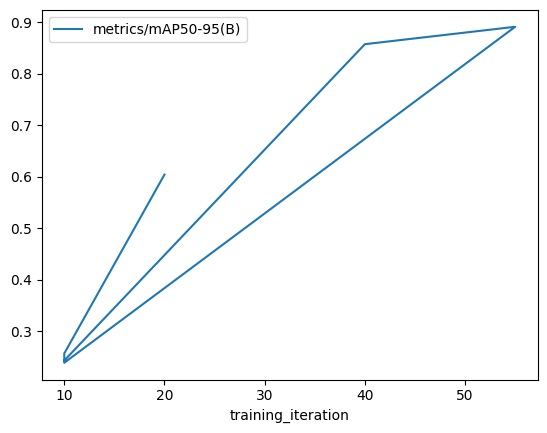

In [ ]:
import matplotlib.pyplot as plt
# Plot Ray Tune results
df = analysis.results_df
df.plot(x='training_iteration', y='metrics/mAP50-95(B)', kind='line')
plt.show()

Validation

In [ ]:
model = YOLO("/content/runs/detect/train/weights/best.pt")

# validation
metrics = model.val(save_json = True)
print(metrics.box.map)  # mAP50-95
print(metrics.box.map50)  # mAP50
print(metrics.box.map75)  # mAP75
print(metrics.box.maps)  # list of mAP50-95 for each category

# Prediction

In [ ]:
import glob
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

image_dir = "/content/drive/MyDrive/yolo_train/dataset/images/test"
# Get all images in the directory
image_paths = glob.glob(os.path.join(image_dir, "*.png"))

# Use YOLO's batch processing for inference
results = model(image_paths)


0: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
1: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
2: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
3: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
4: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
5: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
6: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 56.9ms
7: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 56.9ms
8: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 56.9ms
9: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 56.9ms
10: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 56.9ms
11: 640x640 1 ID, 1 Initial, 1 consent, 1 date, 1 location, 1 contact, 56.9ms
12: 640x640 1 ID, 1 Initial, 1 date, 1 location, 1 diagnosis, 1 treatment, 1 nation_other, 1 birth_year, 1 job_code1, 1 job_code2, 1 have_trip, 1 plan

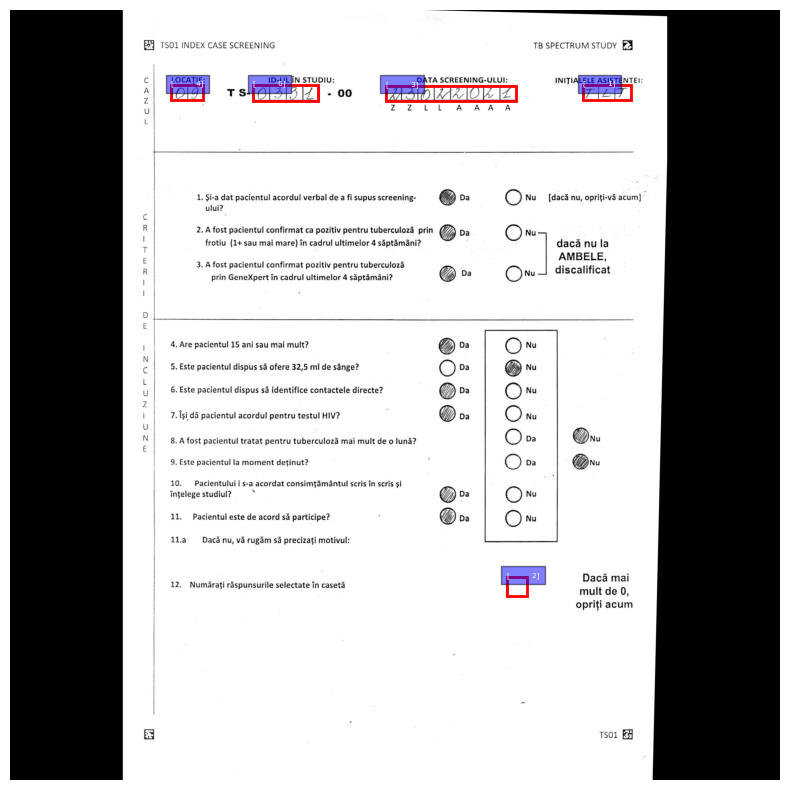

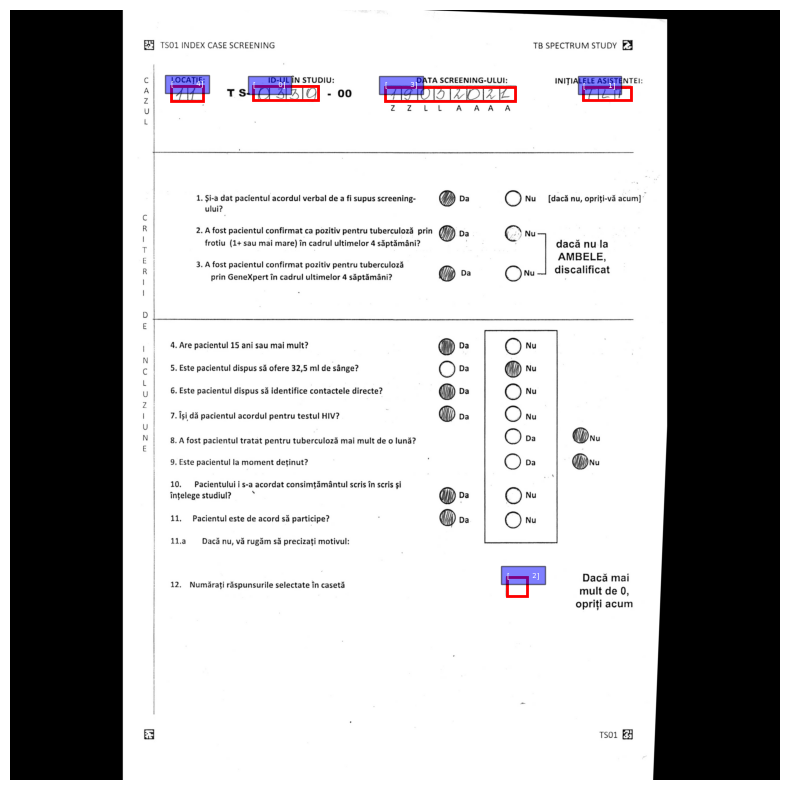

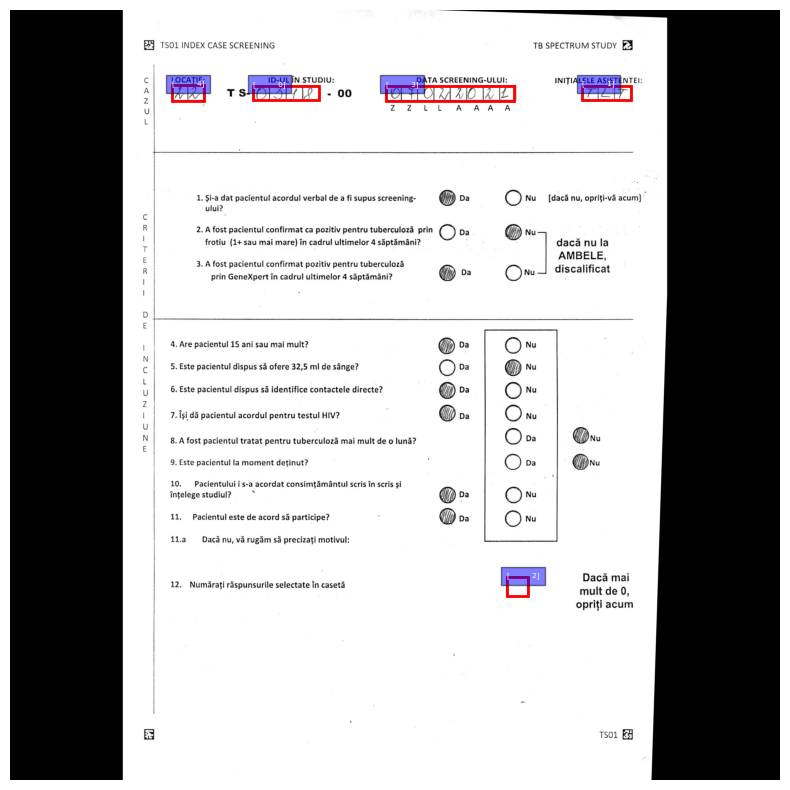

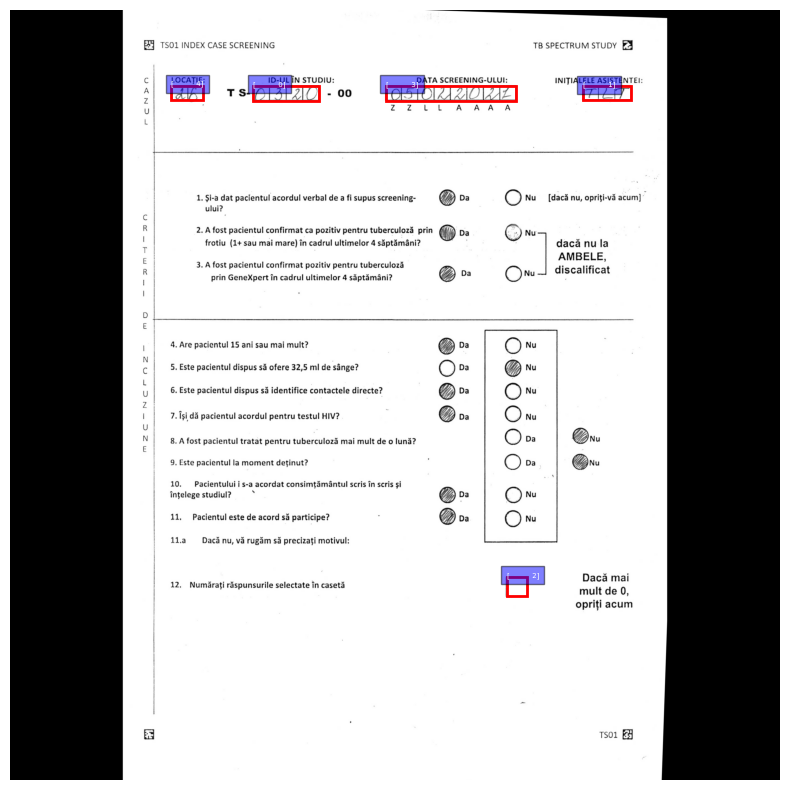

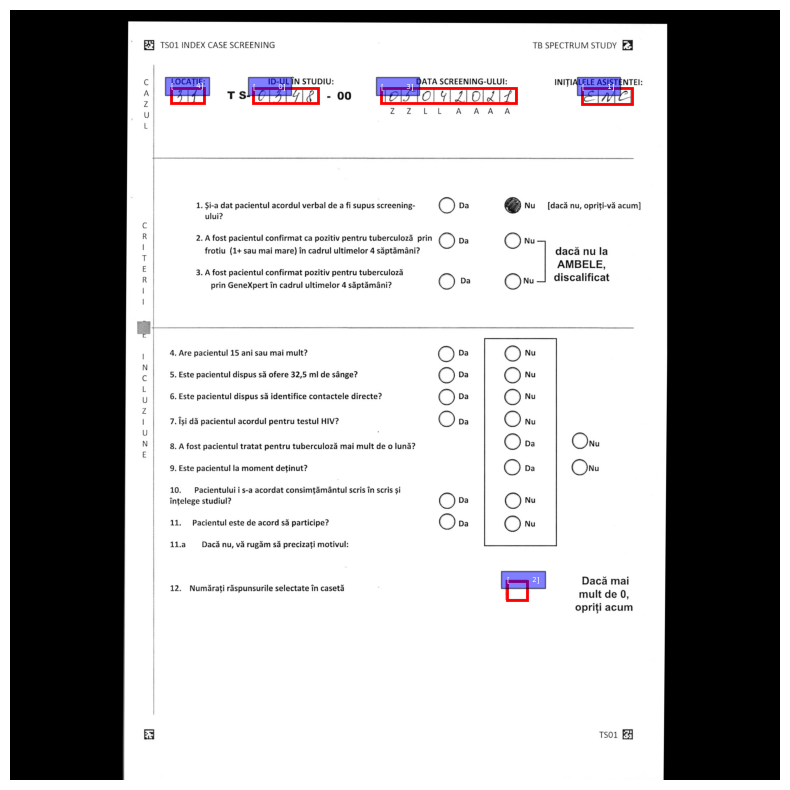

...

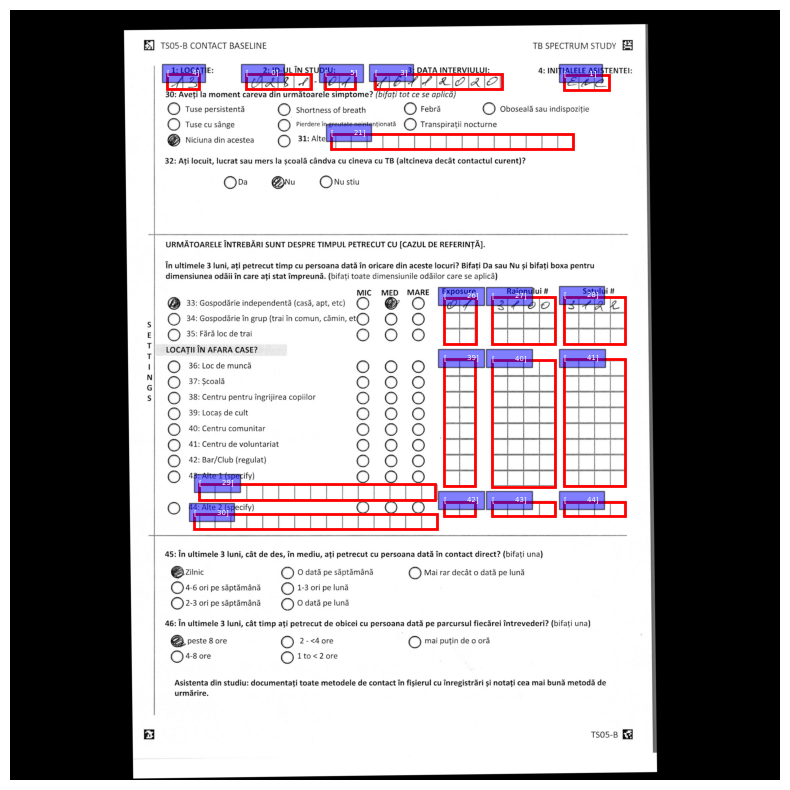

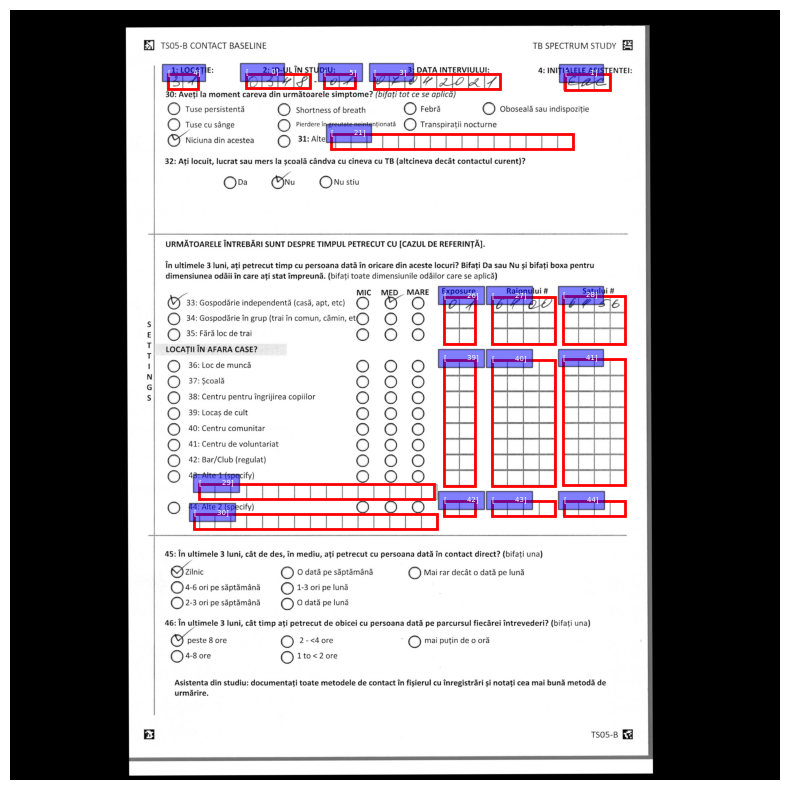

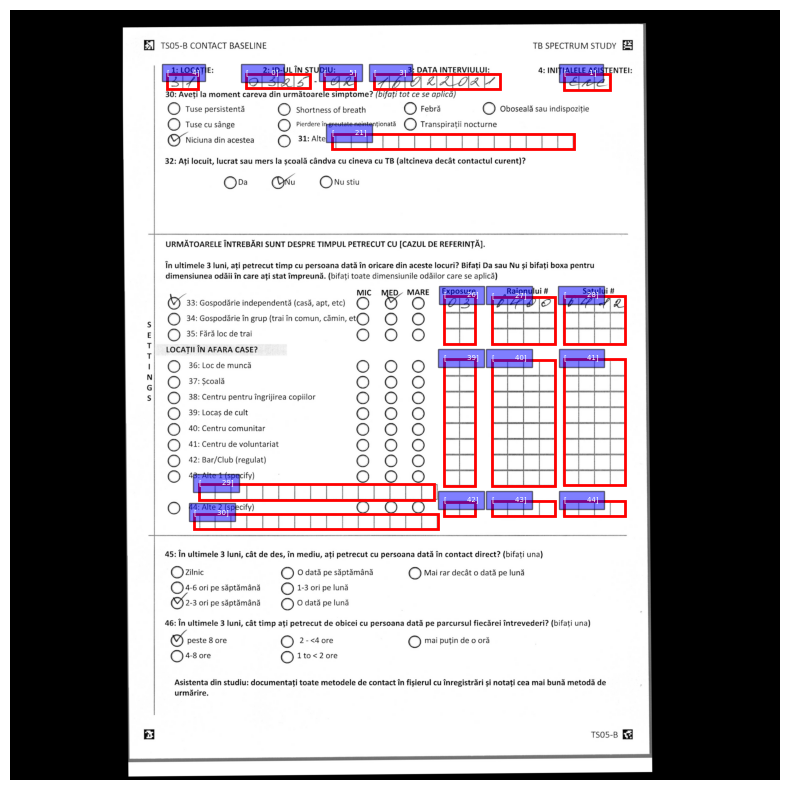

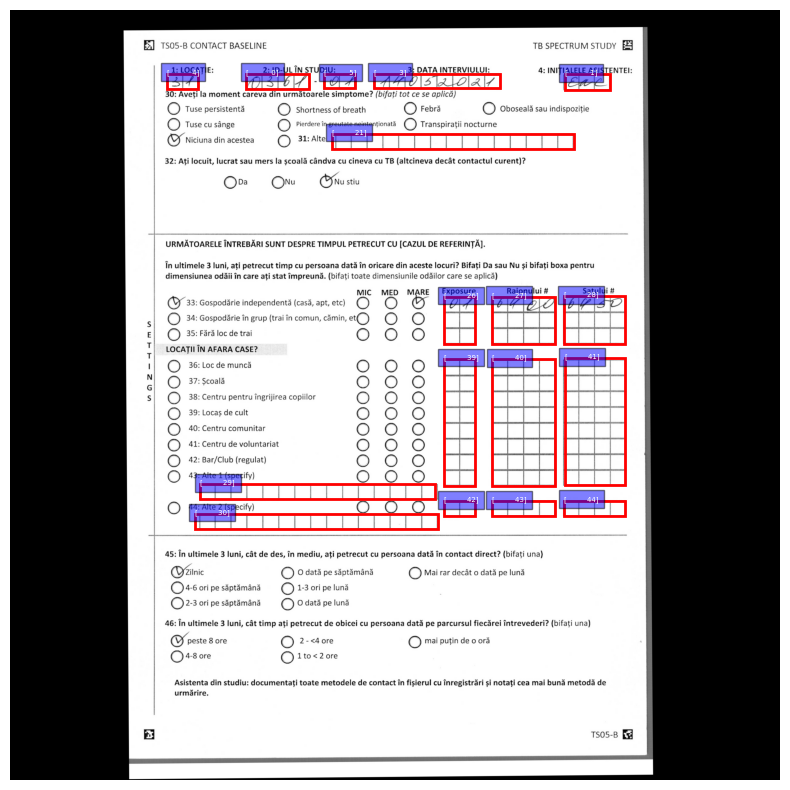

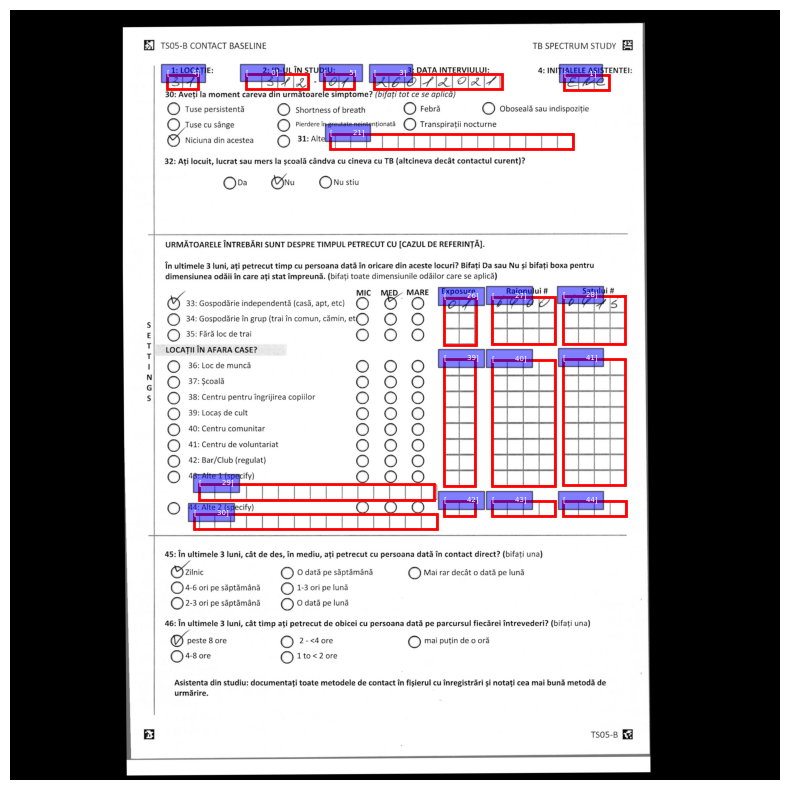

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

# Manually display images with bounding boxes using matplotlib
for idx, result in enumerate(results):
    # Load the original image
    img_path = image_paths[idx]
    img = cv2.imread(img_path)

    # Convert from BGR (OpenCV) to RGB for matplotlib
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Plot the image with matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(img_rgb)
    plt.axis('off')

    # Plot bounding boxes
    for box in result.boxes:  # Assuming 'result.boxes' has the bounding boxes
        # Extract the bounding box (x1, y1, x2, y2) and move to CPU
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()  # Convert to numpy array
        label = box.cls.cpu().numpy()  # class label as numpy array

        # Draw rectangle (Bounding box)
        plt.gca().add_patch(plt.Rectangle(
            (x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=2))

        # Add class label text (optional)
        plt.text(x1, y1, f"{label}", color="white", fontsize=5,
                 bbox=dict(facecolor='blue', alpha=0.5))

    # Show the image with bounding boxes
    plt.show()

In [ ]:
import os
import cv2

# Directory where you want to save the images with bounding boxes
output_dir = '/content/drive/MyDrive/yolo_train/output'
os.makedirs(output_dir, exist_ok=True)  # Create directory if it doesn't exist

# Define font and color for drawing the bounding boxes and text
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 0.9
font_thickness = 1
box_color = (0, 0, 255)  # Red bounding box
text_color = (255, 0, 0)  # blue text

# Manually process and save images with bounding boxes
for idx, result in enumerate(results):
    # Load the original image
    img_path = image_paths[idx]
    img = cv2.imread(img_path)

    # Plot bounding boxes
    for box in result.boxes:
        # Extract the bounding box (x1, y1, x2, y2) and move to CPU
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)  # Convert to integer
        label = int(box.cls.cpu().numpy()[0])  # Convert class label to integer

        # Draw the rectangle (Bounding box)
        cv2.rectangle(img, (x1, y1), (x2, y2), box_color, 2)  # 2 = thickness of the box

        # Put the class label text on the image (optional)
        label_text = f"Class: {label}"
        cv2.putText(img, label_text, (x1, y1 - 10), font, font_scale, text_color, font_thickness, lineType=cv2.LINE_AA)

    # Save the image with bounding boxes
    output_image_path = os.path.join(output_dir, f"result_{idx}.png")
    cv2.imwrite(output_image_path, img)


# downloads model weights to local storage

In [ ]:
import shutil
from google.colab import files

# Path to the folder you want to download
folder_to_zip = '/content/runs'
output_zip_file = '/content/runs.zip'

# Zip the folder
shutil.make_archive(output_zip_file.replace('.zip', ''), 'zip', folder_to_zip)

# Download the zip file
files.download(output_zip_file)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>